In [2]:
import math
import numpy as np
import pandas as pd
import itertools

import math
import numpy as np
import pandas as pd
import sklearn
import scipy
import networkx as nx
from sklearn.feature_extraction import DictVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse import coo_matrix, vstack

from matplotlib_venn import venn2

import matplotlib.pyplot as plt

In [3]:
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', 100)

In [4]:
device_type = {'user_id':str, 'device_id_0':str, 'device_id_1':str, 'device_id_2':str, 'ip':str, 'reach_time':str, 'reach_time_day':str}
cookie_type = {'user_id':str, 'cookieid':str, 'ip':str, 'data_time':str}


In [5]:
file_prefix = '../alidata/data/'
file_prefix = '../../fast_hd/disk1/alidata/data/'

In [6]:
device_df = pd.read_csv(file_prefix + 'ijcai_device_encode_training.csv', dtype=device_type)

In [7]:
cookie_df = pd.read_csv(file_prefix + 'ijcai_cookie_encode_training.csv', dtype=cookie_type)

In [8]:
device_record_number = len(device_df)
cookie_record_number = len(cookie_df)

device_id_0_set = set(device_df['device_id_0'])
device_id_0_number = len(device_id_0_set)
device_id_1_set = set(device_df['device_id_1'])
device_id_1_number = len(device_id_1_set)

cookie_set = set(cookie_df['cookieid'])
cookie_number = len(cookie_set)

device_ip_set = set(device_df['ip'])
device_ip_number = len(device_ip_set)

cookie_ip_set = set(cookie_df['ip'])
cookie_ip_number = len(cookie_ip_set)

share_ip_set = device_ip_set & cookie_ip_set
share_ip_number = len(share_ip_set)





In [9]:
column_name_list = list()
value_list = list()

column_name_list.append('device_record')
column_name_list.append('cookie_record')
column_name_list.append('device_id_0')
column_name_list.append('device_id_1')
column_name_list.append('cookie_set')
column_name_list.append('device_ip_set')
column_name_list.append('cookie_ip_set')
column_name_list.append('share_ip')

value_list.append(device_record_number)
value_list.append(cookie_record_number)
value_list.append(device_id_0_number)
value_list.append(device_id_1_number)
value_list.append(cookie_number)
value_list.append(device_ip_number)
value_list.append(cookie_ip_number)
value_list.append(share_ip_number)

In [10]:
value_list

[29158167, 15066709, 285528, 259390, 618079, 427738, 424200, 228654]

<BarContainer object of 8 artists>

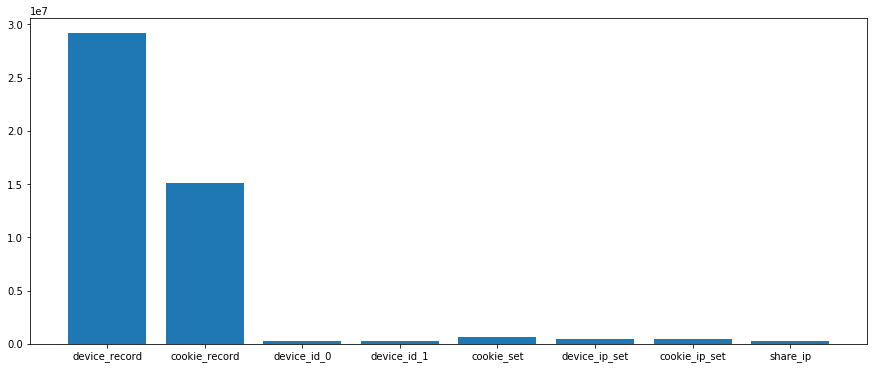

In [11]:
plt.figure(figsize=(15,6))
plt.bar(column_name_list, value_list)

<BarContainer object of 6 artists>

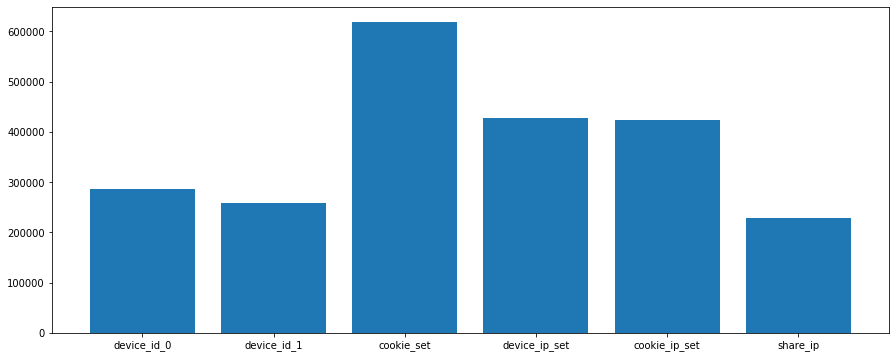

In [12]:
plt.figure(figsize=(15,6))
plt.bar(column_name_list[2:], value_list[2:])

In [13]:
device_id_connection_df = device_df[['device_id_0', 'device_id_1']]
device_id_connection_df = device_id_connection_df.drop_duplicates(subset=['device_id_0', 'device_id_1'])
len(device_id_connection_df)

286737

In [14]:
%%time
device_g=nx.from_pandas_edgelist(device_id_connection_df, 'device_id_0', 'device_id_1')
device_g.remove_nodes_from([np.nan])

CPU times: user 2.52 s, sys: 216 ms, total: 2.74 s
Wall time: 2.74 s


In [15]:
for node in device_g.nodes(data=True):
    if 'type' in node[1].keys():
        pass
    else:
        node[1]['type'] = 'device'

In [16]:
(device_g.number_of_nodes(), device_g.number_of_edges())

(544916, 260993)

In [17]:
connected_device_id = nx.connected_components(device_g)

node_number_list = list()
node_list = list()

for index, connected_device_item in enumerate(sorted(connected_device_id, key=len, reverse=True)):
    node_number_list.append(len(connected_device_item))
    node_list.append(list(connected_device_item))
    
total_connected_group_number = len(node_number_list)

In [18]:
total_connected_group_number

283923

In [19]:
node_number_list[0:10]

[35, 23, 14, 12, 9, 7, 7, 7, 6, 6]

In [20]:
device_mapping_one_to_original = list()
device_mapping_original_to_one = list()


for node_group in node_list:
    
    first_id = node_group[0]
    
    for each_id in node_group:
        device_mapping_one_to_original.append([first_id, each_id])
        device_mapping_original_to_one.append([each_id, first_id])
    

In [21]:
device_mapping_df = pd.DataFrame(device_mapping_original_to_one)
device_mapping_df.columns = ['source_device_id', 'device_id']

In [22]:
device_mapping_dict = dict(zip(list(device_mapping_df['source_device_id']), list(device_mapping_df['device_id'])))

In [23]:
def device_cookie_mapping(device_df, cookie_df, mapping_column_name):

    device_id_0_with_target_df = device_df[[mapping_column_name, 'device_id_0']].drop_duplicates(subset=[mapping_column_name, 'device_id_0'])
    device_id_1_with_target_df = device_df[[mapping_column_name, 'device_id_1']].drop_duplicates(subset=[mapping_column_name, 'device_id_1'])

    device_id_0_with_target_df.columns=[mapping_column_name, 'device_id']
    device_id_1_with_target_df.columns=[mapping_column_name, 'device_id']

    device_id_with_target_df = pd.concat([device_id_0_with_target_df, device_id_1_with_target_df])

    device_id_with_target_df = device_id_with_target_df.drop_duplicates(subset=[mapping_column_name, 'device_id'])

    cookieid_with_target_df = cookie_df[[mapping_column_name, 'cookieid']].drop_duplicates(subset=[mapping_column_name, 'cookieid'])


    device_id_with_target_df.set_index(mapping_column_name, inplace=True)
    cookieid_with_target_df.set_index(mapping_column_name, inplace=True)

    device_cookie_target_df = device_id_with_target_df.join(cookieid_with_target_df, how='inner')

    device_cookie_target_df.reset_index(inplace=True)
    
    return device_cookie_target_df

In [24]:
%%time
device_cookie_user_df = device_cookie_mapping(device_df, cookie_df, 'user_id')

CPU times: user 12.5 s, sys: 2.34 s, total: 14.9 s
Wall time: 14.9 s


In [25]:
device_cookie_user_df['device_cookie'] = device_cookie_user_df['device_id'] + '_' + device_cookie_user_df['cookieid']
device_cookie_user_df.drop_duplicates(subset=['device_cookie'], inplace=True)
device_cookie_user_df['label'] = 1
true_pair_set = set(device_cookie_user_df['device_cookie'])
device_cookie_user_df.set_index('device_cookie', inplace=True)

true_sample_number = len(device_cookie_user_df)
true_sample_number

1420480

In [26]:
device_cookie_user_df.reset_index(inplace=True)
true_pair_set = set(device_cookie_user_df['device_cookie'])
device_cookie_user_df.set_index('device_cookie', inplace=True)

In [27]:
len(true_pair_set)

1420480

In [28]:
true_sample_number

1420480

In [29]:
%%time
device_cookie_ip_df = device_cookie_mapping(device_df, cookie_df, 'ip')

CPU times: user 42.4 s, sys: 10.2 s, total: 52.6 s
Wall time: 52.6 s


In [30]:
%%time
device_cookie_ip_df = device_cookie_ip_df.drop_duplicates(subset=['device_id', 'cookieid'])
device_cookie_ip_df['device_cookie'] = device_cookie_ip_df['device_id'] + '_' + device_cookie_ip_df['cookieid']
device_cookie_ip_df.drop_duplicates(subset=['device_cookie'], inplace=True)
pair_by_ip_set = set(device_cookie_ip_df['device_cookie'])
device_cookie_ip_df.set_index('device_cookie', inplace=True)


CPU times: user 6min 42s, sys: 1min 39s, total: 8min 22s
Wall time: 8min 21s


In [31]:
len(pair_by_ip_set)

178549096

In [32]:
potential_number = len(pair_by_ip_set)

In [33]:
and_set = pair_by_ip_set & true_pair_set

In [34]:
right_number = len(and_set)

In [35]:
cur_recall = right_number/true_sample_number
cur_precision = right_number/len(pair_by_ip_set)

cur_recall, cur_precision

(0.3774470601486821, 0.0030028491435207267)

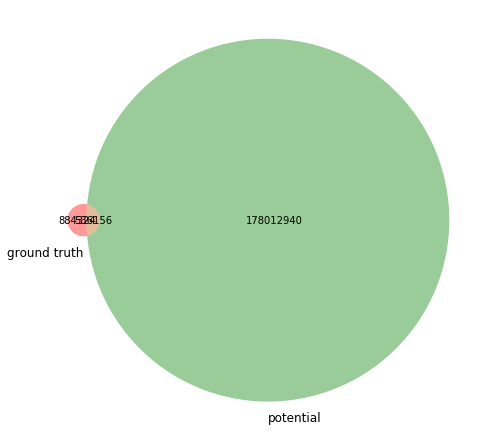

In [36]:
plt.figure(figsize=(8,8))
venn2(subsets = (true_sample_number-right_number, potential_number-right_number, right_number), set_labels = ('ground truth', 'potential'));
plt.show()

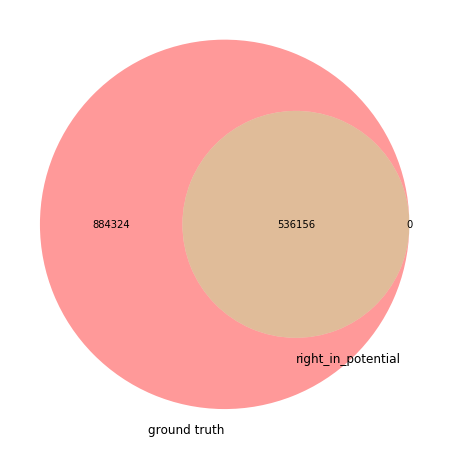

In [37]:
plt.figure(figsize=(8,8))
venn2(subsets = (true_sample_number-right_number, 0, right_number), set_labels = ('ground truth', 'right_in_potential'));
plt.show()

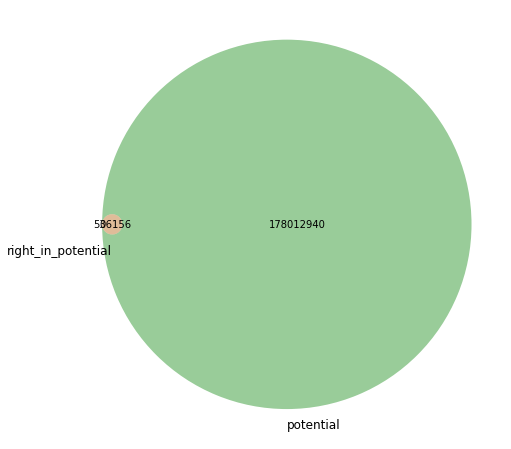

In [38]:
plt.figure(figsize=(8, 8))
venn2(subsets = (0, potential_number-right_number, right_number), set_labels = ('right_in_potential', 'potential'));
plt.show()

In [39]:
device_ip_df = device_df[['user_id', 'device_id_0', 'device_id_1', 'ip', 'reach_time']]

In [40]:
device_ip_df = device_ip_df.drop_duplicates(subset=['user_id', 'device_id_0', 'device_id_1', 'ip', 'reach_time'])

In [41]:
device_ip_df.head()

,user_id,device_id_0,device_id_1,ip,reach_time
0,000157f178ac0da34f8922aba3be58b1,e658d7862413ed37d305eba287a973ad,9200911503e4c0ca7559d8a8e6c0455b,3593efe532ee076e931de631dca691ec.0ec04218402b4...,20170507080341
1,000157f178ac0da34f8922aba3be58b1,e658d7862413ed37d305eba287a973ad,9200911503e4c0ca7559d8a8e6c0455b,3593efe532ee076e931de631dca691ec.0ec04218402b4...,20170507081459
2,000157f178ac0da34f8922aba3be58b1,e658d7862413ed37d305eba287a973ad,9200911503e4c0ca7559d8a8e6c0455b,3593efe532ee076e931de631dca691ec.0ec04218402b4...,20170507092521
4,000157f178ac0da34f8922aba3be58b1,e658d7862413ed37d305eba287a973ad,9200911503e4c0ca7559d8a8e6c0455b,3593efe532ee076e931de631dca691ec.0ec04218402b4...,20170501165227
5,000157f178ac0da34f8922aba3be58b1,e658d7862413ed37d305eba287a973ad,9200911503e4c0ca7559d8a8e6c0455b,3593efe532ee076e931de631dca691ec.0ec04218402b4...,20170501165122


In [42]:
len(device_df)

29158167

In [43]:
len(device_ip_df)

13666031

In [44]:
cookie_ip_df = cookie_df[['user_id', 'cookieid', 'ip', 'data_time']]

In [45]:
cookie_ip_df = cookie_ip_df.drop_duplicates(subset=['user_id', 'cookieid', 'ip', 'data_time'])

In [46]:
cookie_ip_df.head()

,user_id,cookieid,ip,data_time
0,002724ba2ed196b37d62ea478a139b8d,ea96698e0ac16cc5aaba9fb0b2c8f34e,d41ea1af79f76adeb7764b3fd63fc68d.0ec04218402b4...,20170507111217
1,002724ba2ed196b37d62ea478a139b8d,ea96698e0ac16cc5aaba9fb0b2c8f34e,63a3999f249475f530693d57bad83b8d.bd00614e2a194...,20170507234802
2,002724ba2ed196b37d62ea478a139b8d,ea96698e0ac16cc5aaba9fb0b2c8f34e,63a3999f249475f530693d57bad83b8d.bd00614e2a194...,20170507123950
3,002724ba2ed196b37d62ea478a139b8d,ea96698e0ac16cc5aaba9fb0b2c8f34e,d41ea1af79f76adeb7764b3fd63fc68d.0ec04218402b4...,20170507111418
4,002724ba2ed196b37d62ea478a139b8d,ea96698e0ac16cc5aaba9fb0b2c8f34e,d41ea1af79f76adeb7764b3fd63fc68d.0ec04218402b4...,20170507111304


In [47]:
len(cookie_df)

15066709

In [48]:
len(cookie_ip_df)

14496550

In [49]:
def time_suffix_lambda_none(x):
    return ''

def time_suffix_lambda_day(x):
    return x[0:8]

def time_suffix_lambda_hour(x):
    return x[0:10]

In [50]:
time_suffix_lambda = time_suffix_lambda_day

In [51]:
device_ip_df['reach_time_suffix'] = device_ip_df['reach_time'].map(time_suffix_lambda)
device_ip_df['ip_with_suffix'] = device_ip_df['ip'] + '_' + device_ip_df['reach_time_suffix']

In [52]:
cookie_ip_df['data_time_suffix'] = cookie_ip_df['data_time'].map(time_suffix_lambda)
cookie_ip_df['ip_with_suffix'] = cookie_ip_df['ip'] + '_' + cookie_ip_df['data_time_suffix']

In [53]:
device_ip_suffix_set = set(device_ip_df['ip_with_suffix'])
cookie_ip_suffix_set = set(cookie_ip_df['ip_with_suffix'])

In [54]:
ip_suffix_and_set = device_ip_suffix_set & cookie_ip_suffix_set
len(ip_suffix_and_set)

309225

In [55]:
ip_suffix_list = list(ip_suffix_and_set)
ip_suffix_df = pd.DataFrame(ip_suffix_list)
ip_suffix_df.columns=['ip_with_suffix']
ip_suffix_df['ip_suffix_type'] = 1
ip_suffix_df.set_index('ip_with_suffix', inplace=True)

In [56]:
device_ip_df.set_index('ip_with_suffix', inplace=True)
cookie_ip_df.set_index('ip_with_suffix', inplace=True)

In [57]:
%%time
join_device_ip_df = device_ip_df.join(ip_suffix_df)
join_device_ip_df = join_device_ip_df[join_device_ip_df['ip_suffix_type'] == 1]
join_cookie_ip_df = cookie_ip_df.join(ip_suffix_df)
join_cookie_ip_df = join_cookie_ip_df[join_cookie_ip_df['ip_suffix_type'] == 1]

(len(join_device_ip_df), len(device_ip_df), len(join_cookie_ip_df), len(cookie_ip_df))

CPU times: user 27.5 s, sys: 5.66 s, total: 33.1 s
Wall time: 33.1 s


(7803838, 13666031, 6838420, 14496550)

In [58]:
join_device_ip_df.reset_index(inplace=True)
join_cookie_ip_df.reset_index(inplace=True)

In [59]:
tmp_device_ip_df = join_device_ip_df[['ip_with_suffix', 'device_id_0']]
tmp_device_ip_df.columns=['ip', 'device_id_0']
tmp_device_ip_df = tmp_device_ip_df.drop_duplicates(subset=['ip', 'device_id_0'])
len(tmp_device_ip_df)

706413

In [60]:
%%time
device0_ip_g = nx.from_pandas_edgelist(tmp_device_ip_df, 'device_id_0', 'ip')
device0_ip_g.remove_nodes_from([np.nan])

CPU times: user 20.8 s, sys: 7.5 s, total: 28.3 s
Wall time: 28.3 s


In [61]:
tmp_device_ip_df = join_device_ip_df[['ip_with_suffix', 'device_id_1']]
tmp_device_ip_df.columns=['ip', 'device_id_1']
tmp_device_ip_df = tmp_device_ip_df.drop_duplicates(subset=['ip', 'device_id_1'])
len(tmp_device_ip_df)

687644

In [62]:
%%time
device1_ip_g = nx.from_pandas_edgelist(tmp_device_ip_df, 'device_id_1', 'ip')
device1_ip_g.remove_nodes_from([np.nan])

CPU times: user 19.3 s, sys: 3.87 s, total: 23.2 s
Wall time: 23.1 s


In [63]:
%%time
device_ip_g = nx.compose(device_g, device0_ip_g)
device_ip_g = nx.compose(device_ip_g, device1_ip_g)
device_ip_g.remove_nodes_from([np.nan])

CPU times: user 48.3 s, sys: 6.6 s, total: 54.9 s
Wall time: 54.9 s


In [64]:
(device_ip_g.number_of_nodes(), device_ip_g.number_of_edges())

(854141, 1607391)

In [65]:
for node in device_ip_g.nodes(data=True):
    if 'type' in node[1].keys():
        pass
    else:
        node[1]['type'] = 'ip'


In [66]:
tmp_cookie_ip_df = join_cookie_ip_df[['ip_with_suffix', 'cookieid']]
tmp_cookie_ip_df.columns=['ip', 'cookieid']
tmp_cookie_ip_df = tmp_cookie_ip_df.drop_duplicates(subset=['ip', 'cookieid'])
len(tmp_cookie_ip_df)

767244

In [67]:
%%time
cookie_ip_g = nx.from_pandas_edgelist(tmp_cookie_ip_df, 'cookieid', 'ip')
cookie_ip_g.remove_nodes_from([np.nan])

CPU times: user 1.88 s, sys: 200 ms, total: 2.08 s
Wall time: 2.08 s


In [68]:
(cookie_ip_g.number_of_nodes(), cookie_ip_g.number_of_edges())

(690367, 767244)

In [69]:
%%time
device_ip_cookie_g = nx.compose(device_ip_g, cookie_ip_g)

CPU times: user 29.4 s, sys: 6.14 s, total: 35.5 s
Wall time: 35.5 s


In [70]:
(device_ip_cookie_g.number_of_nodes(), device_ip_cookie_g.number_of_edges())

(1235283, 2374635)

In [71]:
for node in device_ip_cookie_g.nodes(data=True):
    if 'type' in node[1].keys():
        pass
    else:
        node[1]['type'] = 'cookie'

In [72]:
connected_device_ip_cookie = nx.connected_components(device_ip_cookie_g)

node_number_list = list()

for index, connected_device_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):
    node_number_list.append(len(connected_device_item))
    
total_connected_group_number = len(node_number_list)

In [73]:
total_connected_group_number

99573

In [74]:
node_number_list[0:10]

[909391, 183, 176, 70, 61, 58, 57, 53, 51, 50]

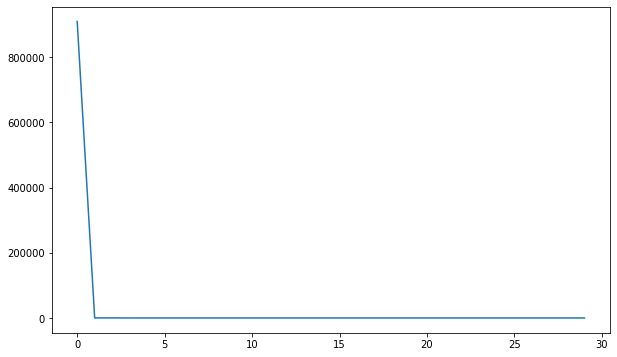

In [75]:
plt.figure(figsize=(10,6))
plt.plot(node_number_list[0:30])

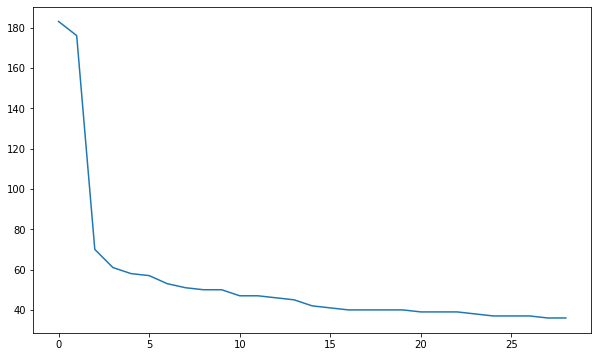

In [76]:
plt.figure(figsize=(10,6))
plt.plot(node_number_list[1:30])

### high level view of top connected group

Get the top 100 connected group, except the top 1, which has extremely large node number.

In [77]:
sample_node_list = list()
index = 0

connected_device_ip_cookie = nx.connected_components(device_ip_cookie_g)

for index, connected_device_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):
    

    if (index > 100):
        break
       
    if (len(connected_device_item) < 200):

        sample_node_list.append(list(connected_device_item))

In [78]:
color_state_map = {'device': 'blue', 'ip': 'red', 'public_ip':'purple', 'cookie':'orange', 'break_point':'green'}

In [79]:
all_sample_node_flatten = list()
for sample_nodes in sample_node_list:
    all_sample_node_flatten.extend(sample_nodes)

In [80]:
len(all_sample_node_flatten)

3552

In [256]:
def display_graph(target_g):
    plt.figure(figsize=(20, 20), dpi=80)
    nx.draw(target_g, node_size=50, node_color=[color_state_map[node[1]['type']] 
                        for node in target_g.nodes(data=True)])

In [81]:
device_connected_sub_g = device_ip_cookie_g.subgraph(all_sample_node_flatten)

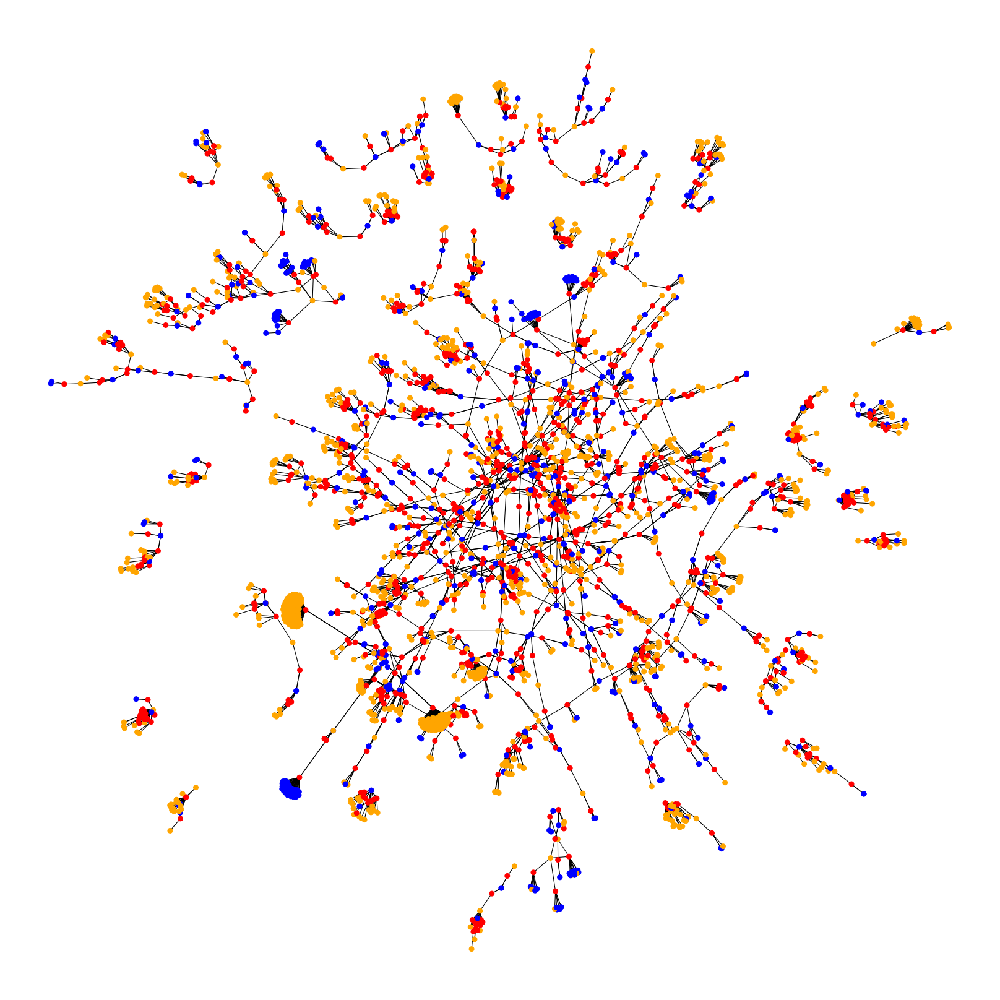

In [82]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(device_connected_sub_g, node_size=50, node_color=[color_state_map[node[1]['type']] 
                    for node in device_connected_sub_g.nodes(data=True)])

### Display each of the top connected group

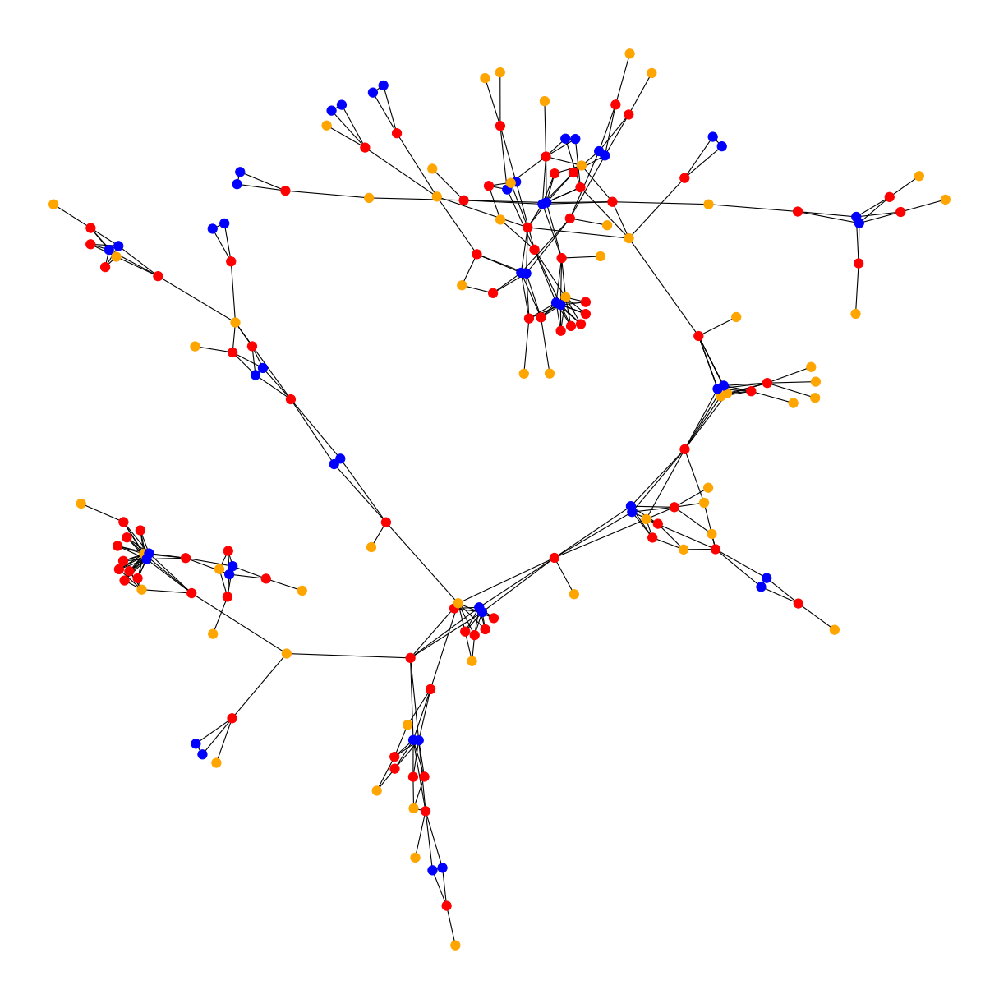

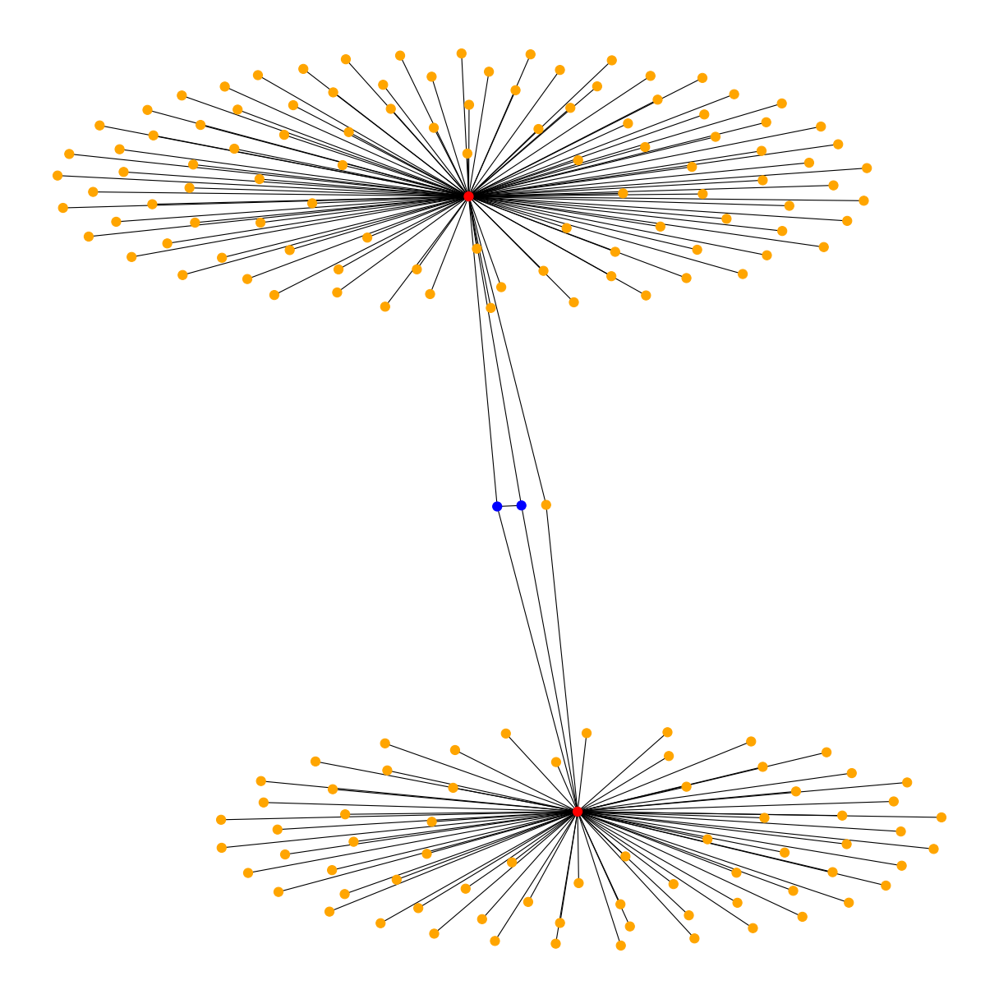

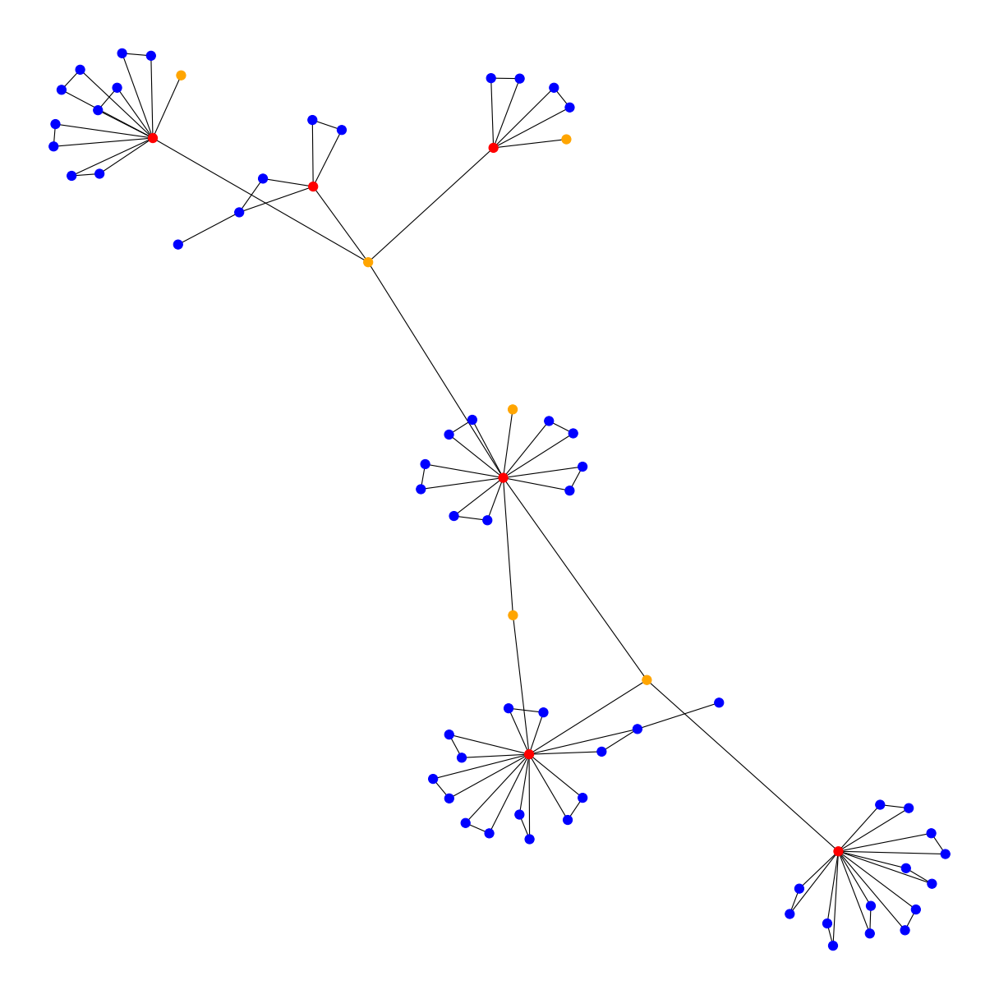

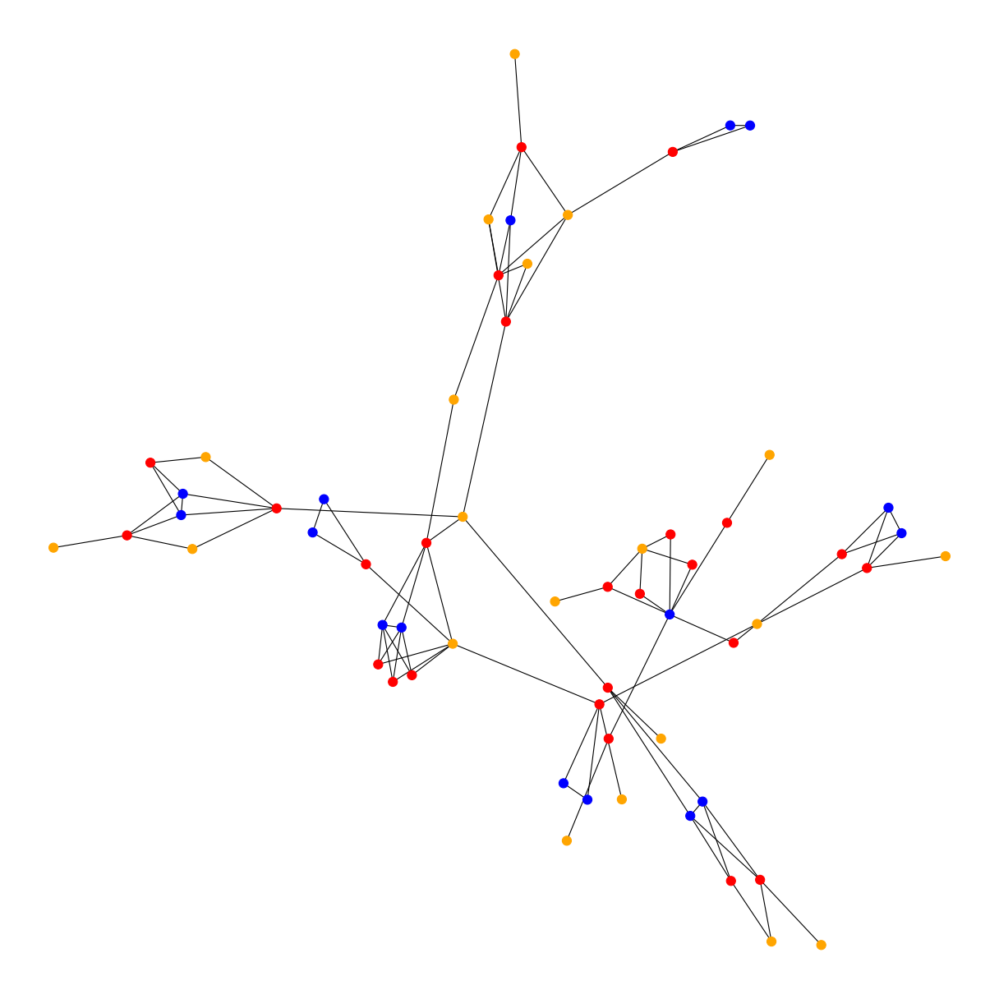

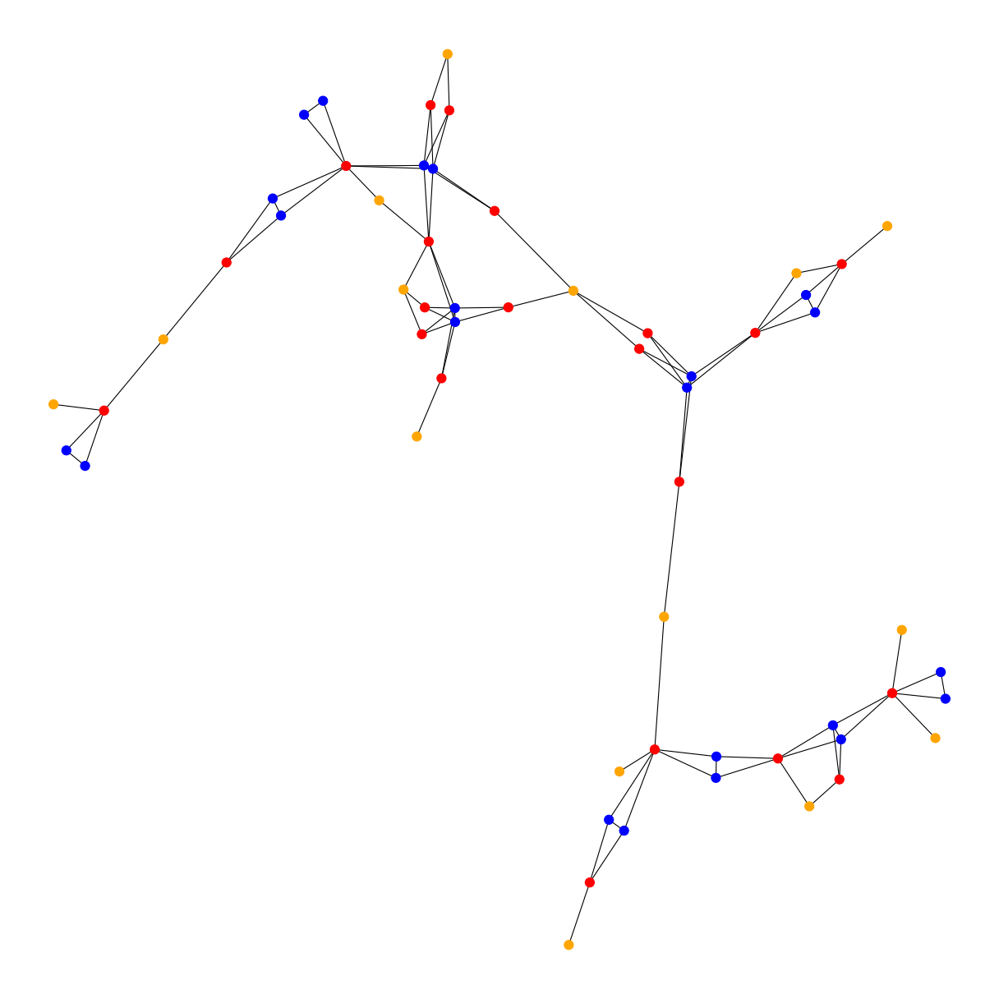

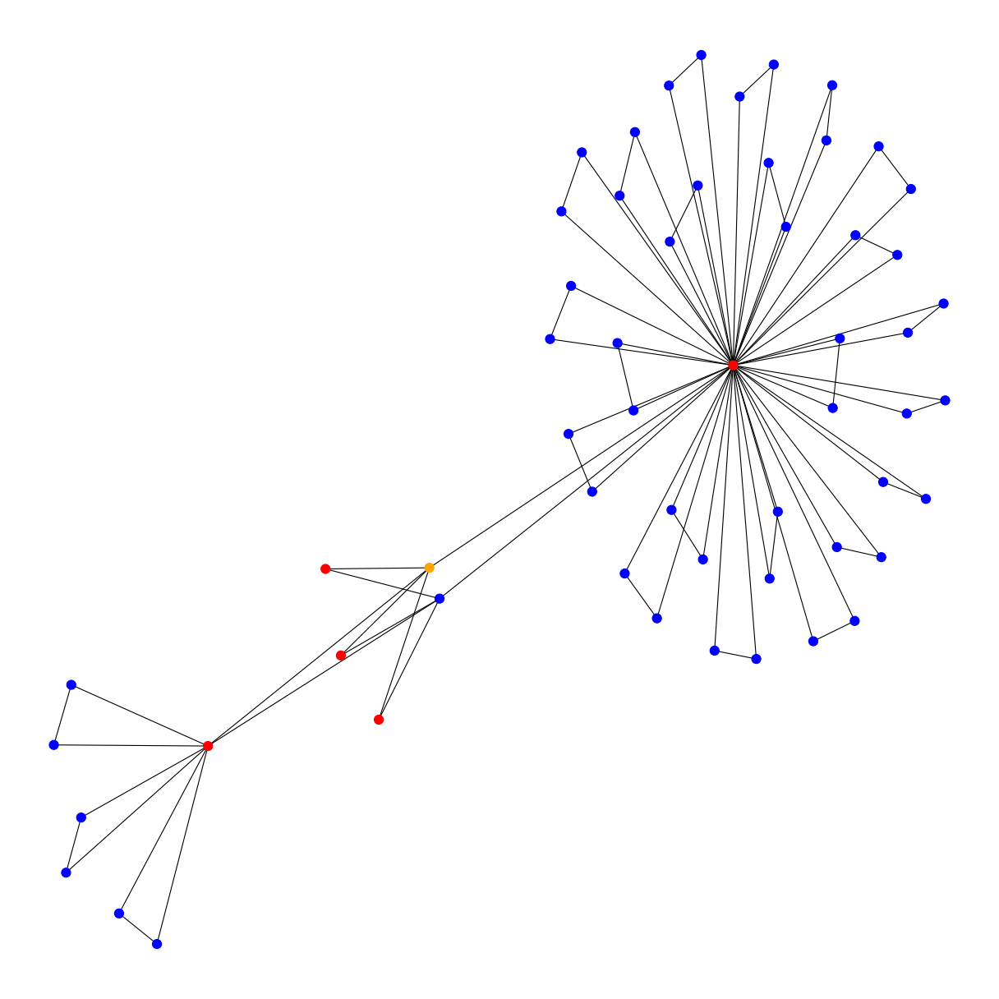

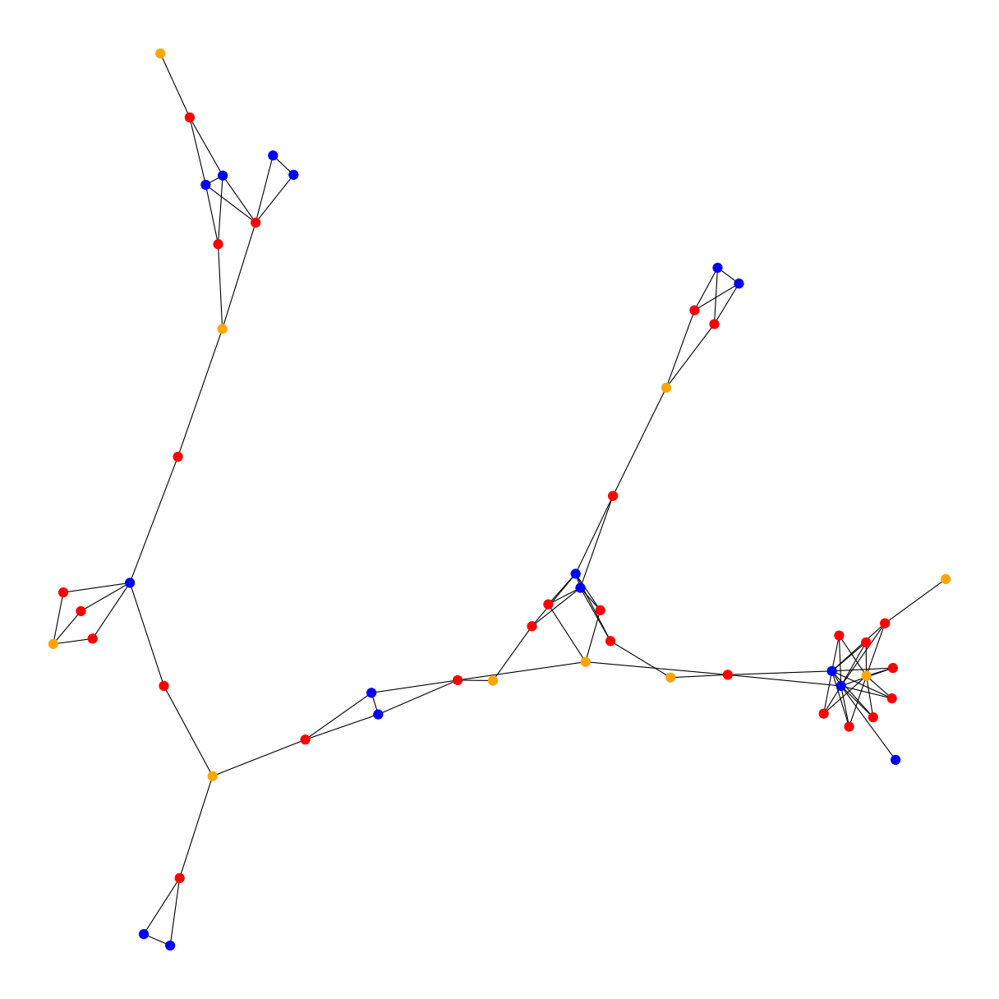

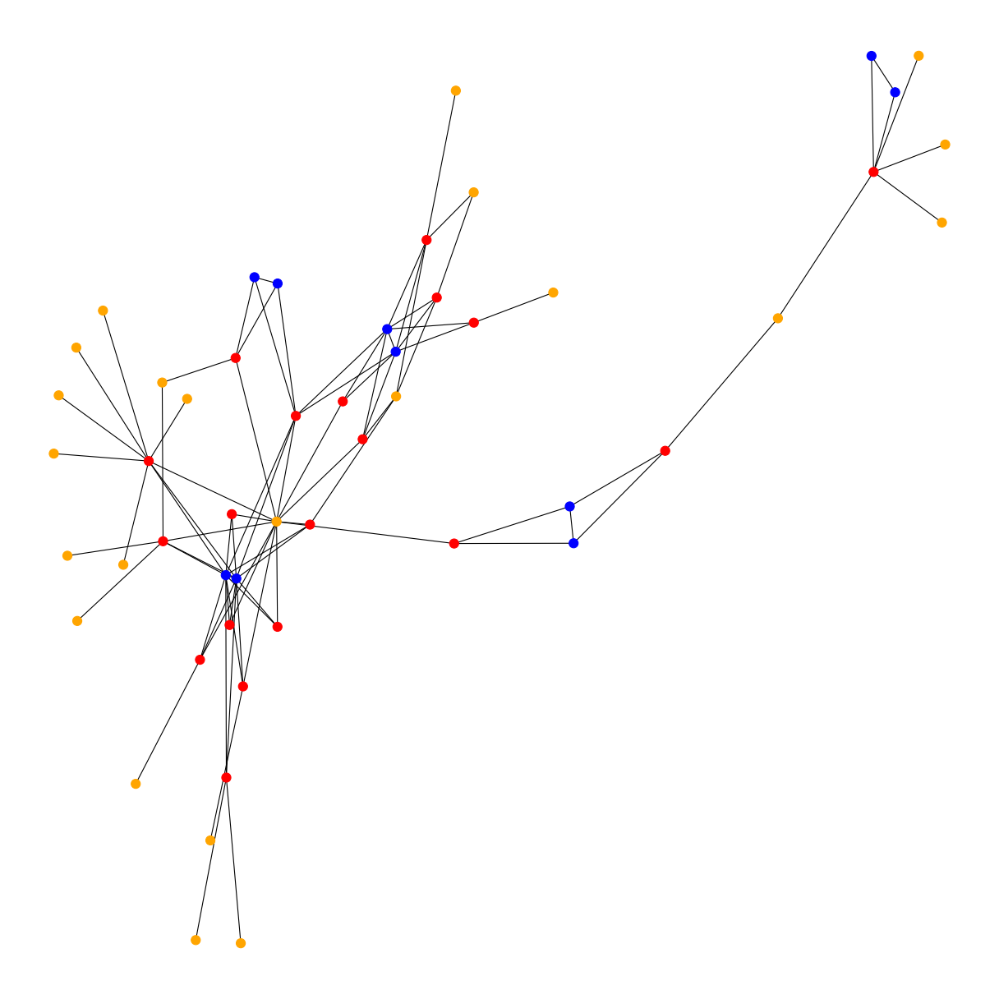

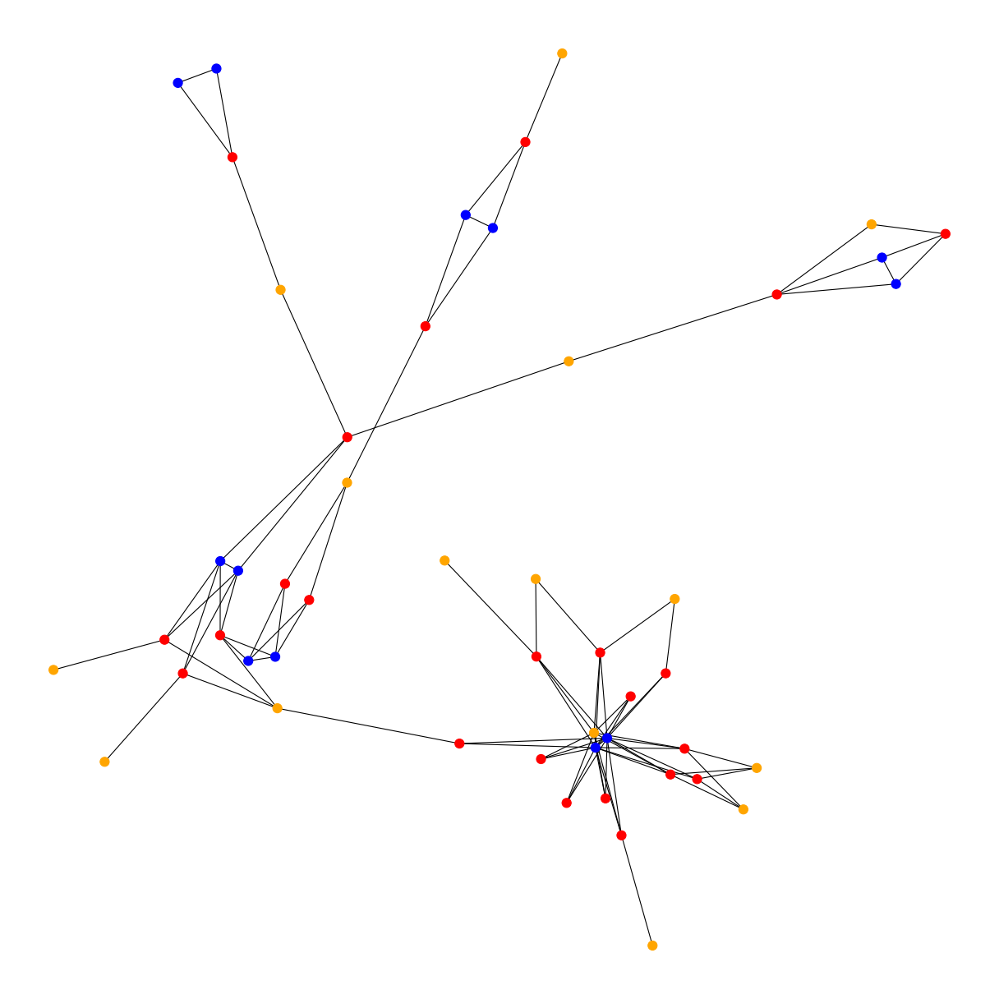

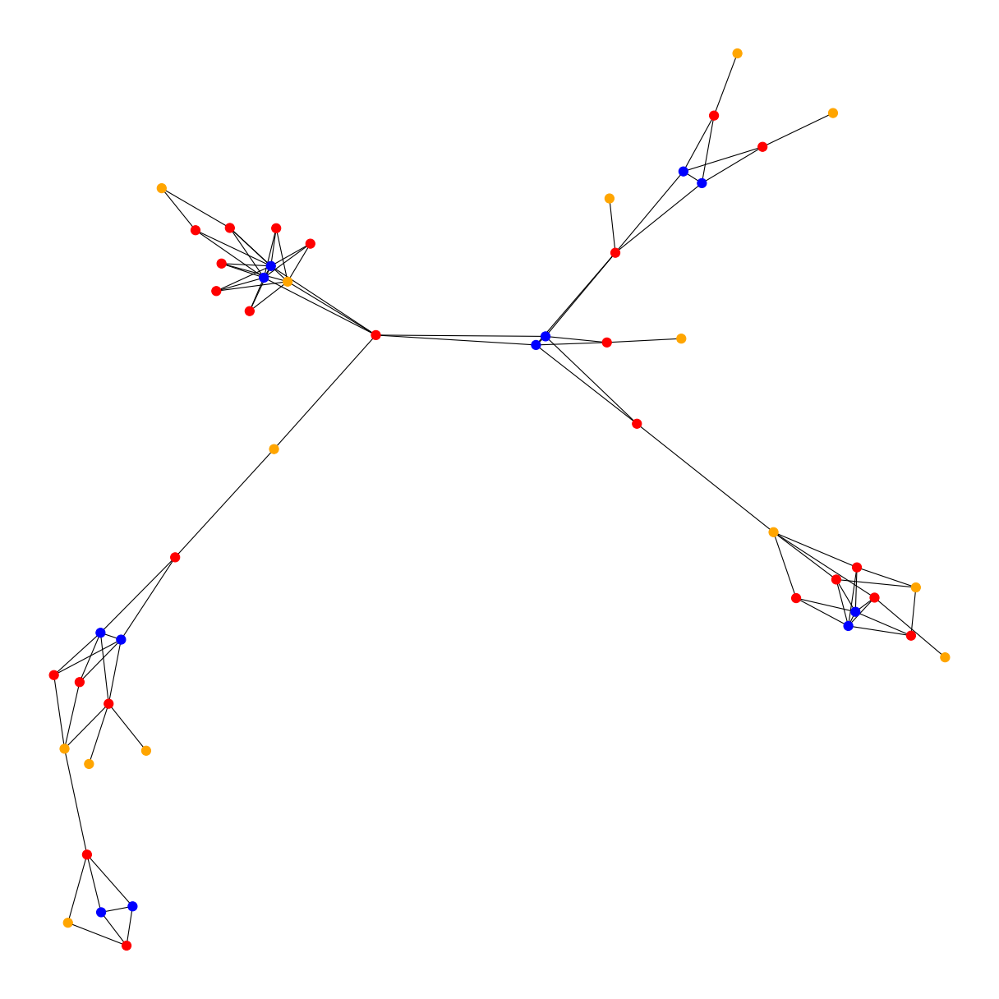

In [83]:
number_of_sub_graph_to_display = 10
index = 1
for sample_nodes in sample_node_list:
    
    if (index > number_of_sub_graph_to_display):
        break
    index = index + 1
    
    device_connected_sub_g = device_ip_cookie_g.subgraph(sample_nodes)
    
    plt.figure(figsize=(15, 15), dpi=80)
    nx.draw(device_connected_sub_g, node_size=100, node_color=[color_state_map[node[1]['type']] 
                    for node in device_connected_sub_g.nodes(data=True)])
    

In [84]:
def seperate_community_from (targe_g, size_limit=200):
    
    group_diameter_limit = 6

    connected_device_ip_cookie = nx.connected_components(targe_g)

    small_community_list = list()

    large_community_list = list()
    large_community_apart_list = list()


    device_collection = list()
    cookie_collection = list()

    large_device_collection = list()
    large_cookie_collection = list()

    # large_group_index = 0

    for index, connected_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):



        if (len(connected_item) < size_limit):

            connected_node_name_list = list(connected_item)
            sub_connected_node_g = device_ip_cookie_g.subgraph(connected_node_name_list)

            sub_diameter = nx.diameter(sub_connected_node_g)

            if (sub_diameter < group_diameter_limit):
                small_community_list.append(connected_node_name_list)

                device_sub_collection = list()
                cookie_sub_collection = list()

                for node_name in connected_node_name_list:
                    if (device_ip_cookie_g.nodes[node_name]['type'] == 'ip'):
                        # the node is an 'ip' node
                        # do nothing
                        pass

                    elif (device_ip_cookie_g.nodes[node_name]['type'] == 'device'):
                        # the node is a 'device' node
                        device_sub_collection.append(node_name)
                    elif (device_ip_cookie_g.nodes[node_name]['type'] == 'cookie'):
                        # the node is a 'cookie' node
                        cookie_sub_collection.append(node_name)

                device_collection.append(device_sub_collection)
                cookie_collection.append(cookie_sub_collection)

            else:
                large_community_list.append(connected_node_name_list)

    #             large_group_index = large_group_index + 1
    #             print(large_group_index, end='  ')

                gn_iter = nx.algorithms.community.centrality.girvan_newman(sub_connected_node_g)

                too_large = True

    #             large_group_sub_index = 0

                while (too_large):
                    next_level = next(gn_iter)
    #                 large_group_sub_index = large_group_sub_index + 1
    #                 print (large_group_sub_index, end=': ')
                    too_large = False

                    sub_community_node_list = list()


                    for node_group in next_level:
                        sub_community_g = sub_connected_node_g.subgraph(node_group)
                        sub_community_node_list.append(node_group)

                        sub_community_g_diameter = nx.diameter(sub_community_g)
                        if (sub_community_g_diameter >= group_diameter_limit):
                            too_large = True
                            break

                    if (not too_large):

    #                     print (' ')
    #                     print('found:', end=' ')

                        sub_community_node_index = 0

                        for sub_connected_node_name_list in sub_community_node_list:

                            sub_community_node_index =  sub_community_node_index  + 1

    #                         print (sub_community_node_index, end=' ')

                            device_sub_collection = list()
                            cookie_sub_collection = list()

                            for node_name in sub_connected_node_name_list:
                                if (device_ip_cookie_g.nodes[node_name]['type'] == 'ip'):
                                    # the node is an 'ip' node
                                    # do nothing
                                    pass

                                elif (device_ip_cookie_g.nodes[node_name]['type'] == 'device'):
                                    # the node is a 'device' node
                                    device_sub_collection.append(node_name)
                                elif (device_ip_cookie_g.nodes[node_name]['type'] == 'cookie'):
                                    # the node is a 'cookie' node
                                    cookie_sub_collection.append(node_name)

                            large_device_collection.append(device_sub_collection)
                            large_cookie_collection.append(cookie_sub_collection)

                            large_community_apart_list.append(sub_community_node_list)

    return (device_collection, cookie_collection, \
            large_device_collection, large_cookie_collection, small_community_list, large_community_list, large_community_apart_list)


In [85]:
device_collection, cookie_collection, \
    large_device_collection, large_cookie_collection, \
    small_community_list, large_community_list, large_community_apart_list =\
    seperate_community_from(device_ip_cookie_g)

In [86]:
def draw_community_list(g, community_list,  start_index, number):
    
    save_line = 9000
    
    number_of_sub_graph_to_display = number


    for i in range(number_of_sub_graph_to_display):

        sample_nodes = community_list[start_index + i]
        
        if (len(sample_nodes) < save_line):

            device_connected_sub_g = g.subgraph(sample_nodes)

            plt.figure(figsize=(15, 15), dpi=80)
            nx.draw(device_connected_sub_g, node_size=100, node_color=[color_state_map[node[1]['type']] 
                            for node in device_connected_sub_g.nodes(data=True)])

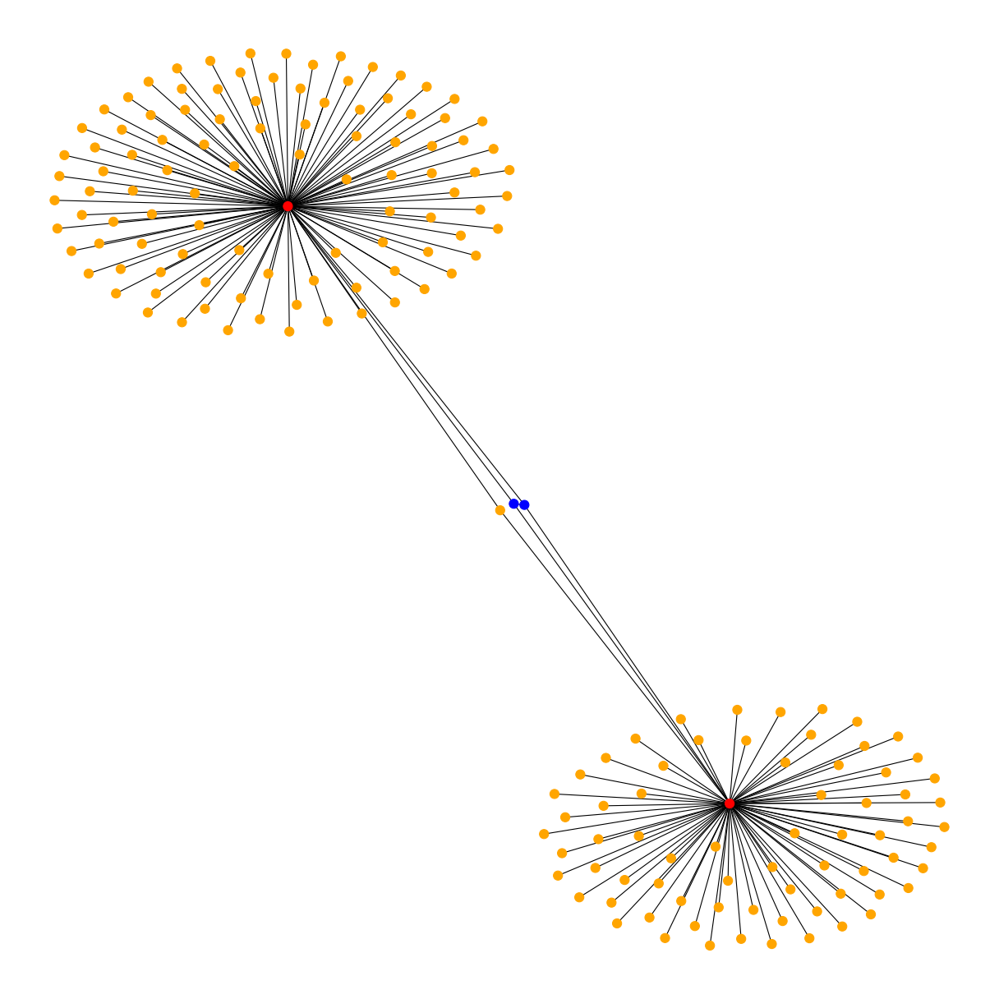

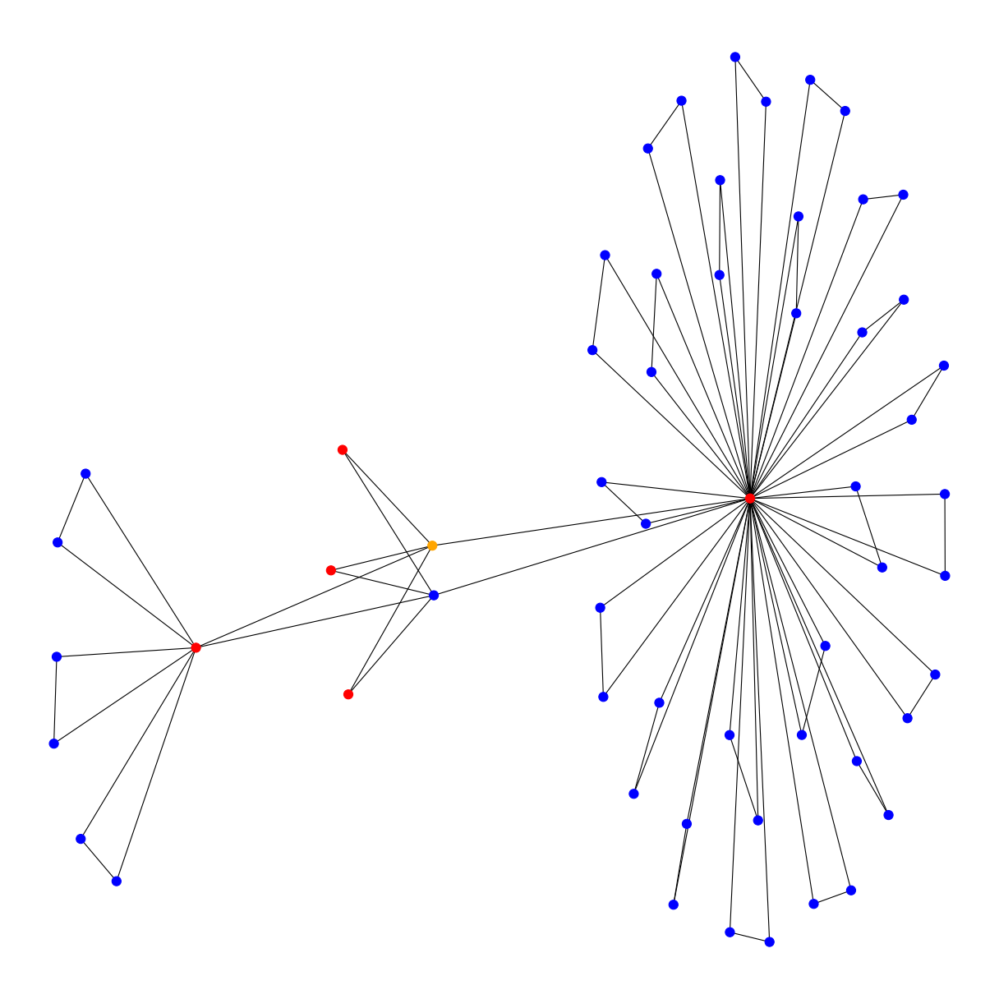

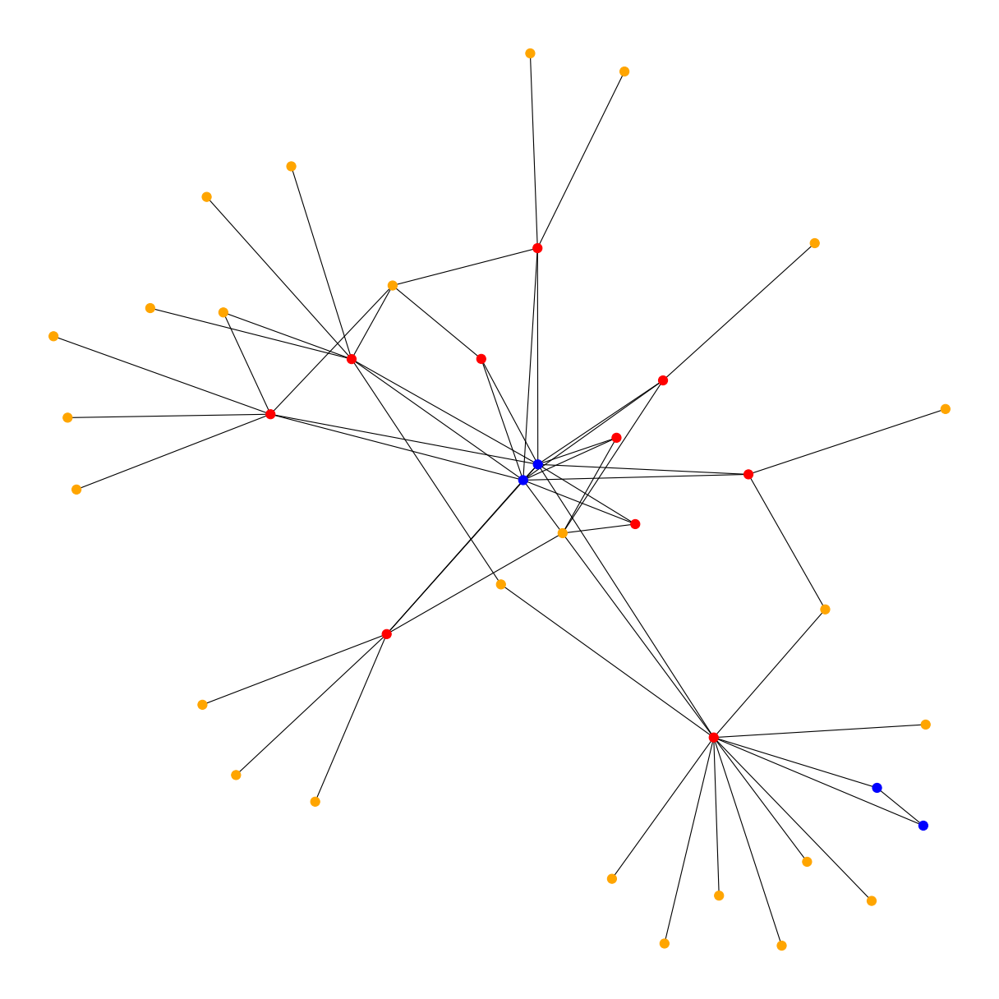

In [87]:
draw_community_list(device_ip_cookie_g, small_community_list, 0, 3)

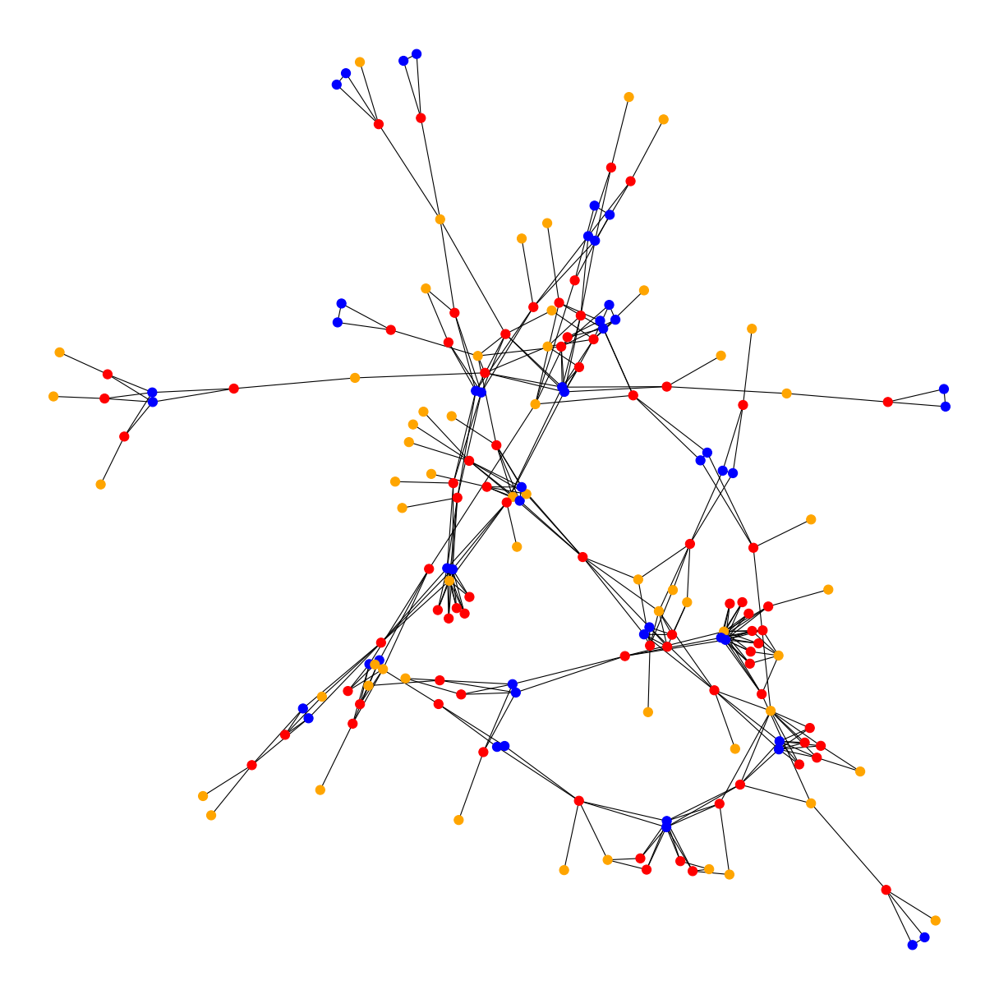

In [88]:
draw_community_list(device_ip_cookie_g, large_community_list, 0, 1)

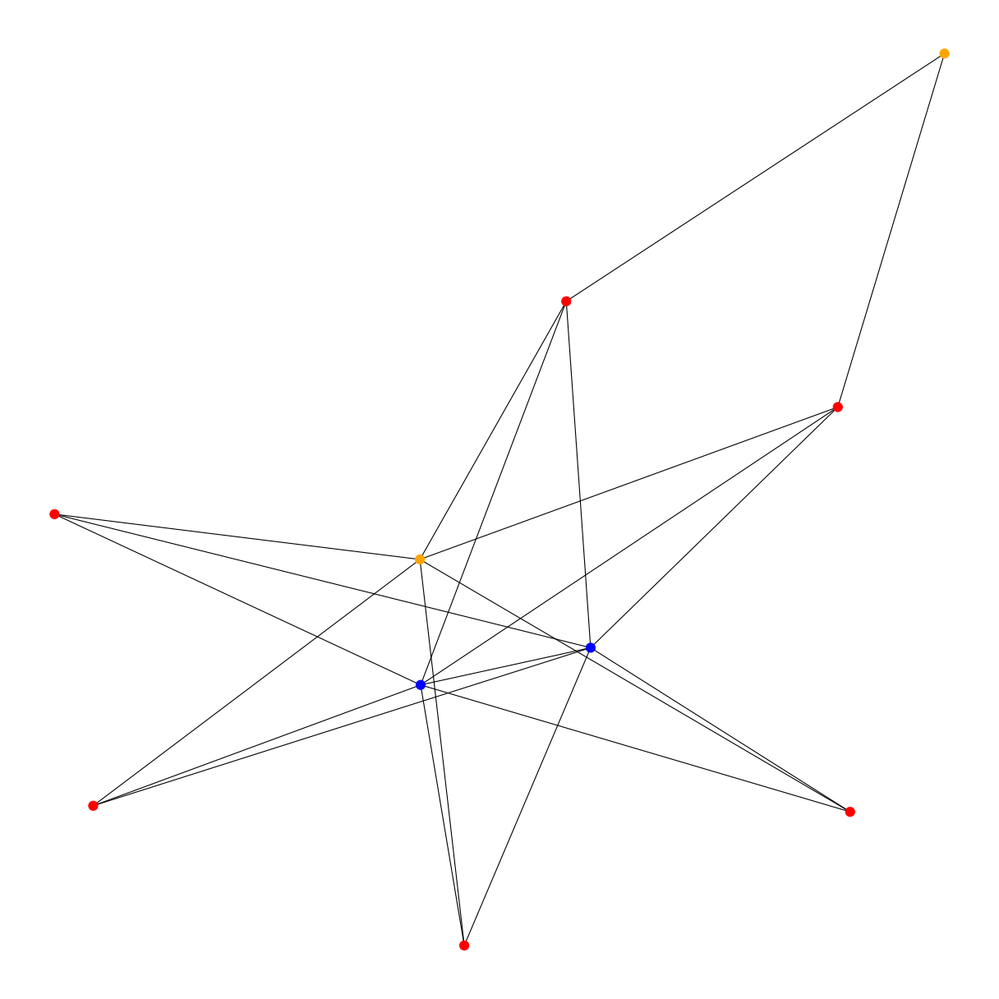

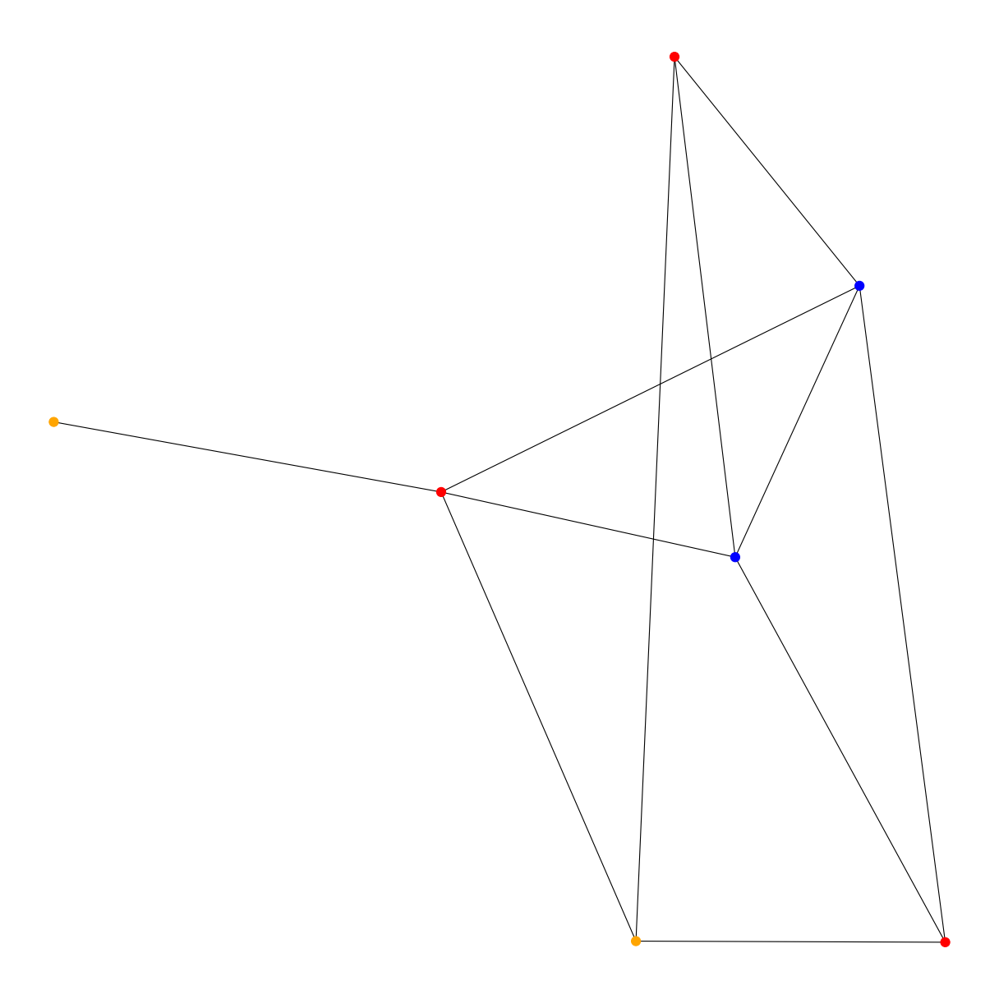

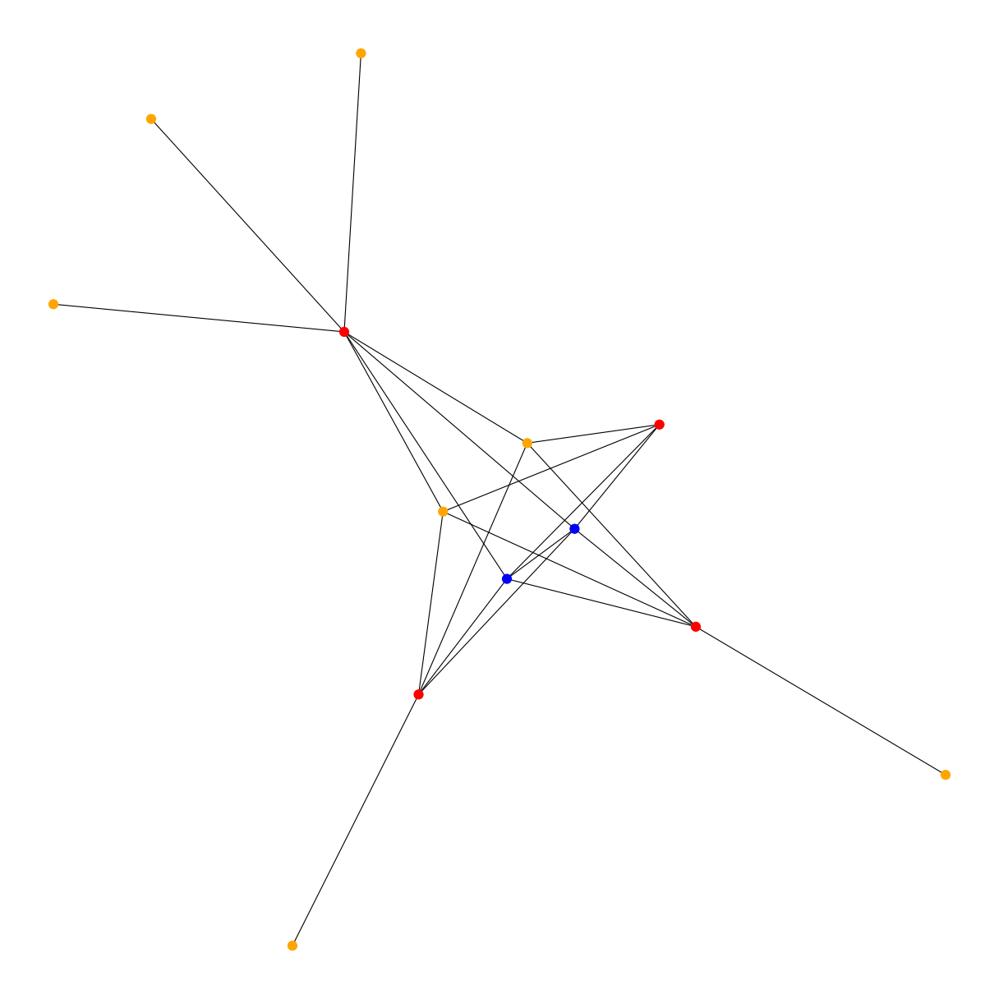

In [89]:
draw_community_list(device_ip_cookie_g, large_community_apart_list[0], 0, 3)

In [90]:
def get_production_set(device_collection, cookie_collection):
    length = len(device_collection)
    all_list = list()
    for i in range(length):
        for item in itertools.product(device_collection[i], cookie_collection[i]):
            all_list.append(item[0] + '_' + item[1])
            
    return set(all_list)

In [91]:
potential_pair_list = list()
potential_pair_type_list = list()


In [92]:
small_group_pair_set = get_production_set(device_collection, cookie_collection)

In [93]:
large_group_pair_set = get_production_set(large_device_collection, large_cookie_collection)

In [94]:
potential_pair_list.extend(small_group_pair_set)
potential_pair_type_list.extend([1] * len(small_group_pair_set))

potential_pair_list.extend(large_group_pair_set)
potential_pair_type_list.extend([2] * len(large_group_pair_set))

In [95]:
len(potential_pair_list), len(potential_pair_type_list)

(130942, 130942)

In [96]:
potential_pair_set = set(potential_pair_list)

In [97]:
len(potential_pair_set)

130942

In [98]:
len(true_pair_set)

1420480

In [99]:
cur_and_set = potential_pair_set & true_pair_set

In [100]:
cur_recall = len(cur_and_set)/len(true_pair_set)
cur_precision = len(cur_and_set)/len(potential_pair_set)
(cur_recall, cur_precision)

(0.07510700608245101, 0.8147729529104489)

In [267]:
potential_number = 130942
right_number = potential_number * 0.8147729529104489

In [268]:
right_number

106688.0

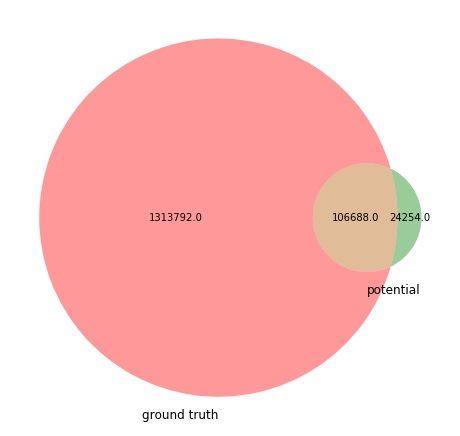

In [269]:
plt.figure(figsize=(8,8))
venn2(subsets = (true_sample_number-right_number, potential_number-right_number, right_number), set_labels = ('ground truth', 'potential'));
plt.show()

In [101]:
potential_pair_df = pd.DataFrame(potential_pair_list)
potential_pair_df.columns=['device_cookie']
potential_pair_df['type'] = potential_pair_type_list

In [102]:
len(potential_pair_df)

130942

In [103]:
potential_pair_df.head()

,device_cookie,type
0,ba5b4cd4b6c733be8b969c6287f84ad5_7ded2aae109cb...,1
1,0dbde15369013998a6926c8ce453fb4c_1c8b0bf15180b...,1
2,bf2d6a63154afa23b2e066bd720c0fba_2a28c7555b1dd...,1
3,70748f93204c5e7c46990d00b89f3536_475c846f31596...,1
4,60e0f05d341d2ae101cb4695f3a5b686_7add9cf1ea513...,1


### look into the elements with large IP neighbours in the largest group

In [178]:
largest_components=max(nx.connected_components(device_ip_cookie_g),key=len)

largest_items = list(largest_components)

largest_sub_g = device_ip_cookie_g.subgraph(largest_items)

(largest_sub_g.number_of_nodes(), largest_sub_g.number_of_edges())

(909391, 2062327)

In [105]:
degree_pair = nx.degree(largest_sub_g)
degree_pair_list = list(degree_pair)
degree_pair_list.sort(key=lambda x:x[1], reverse=True)
node_number_list = [item[1] for item in degree_pair_list]


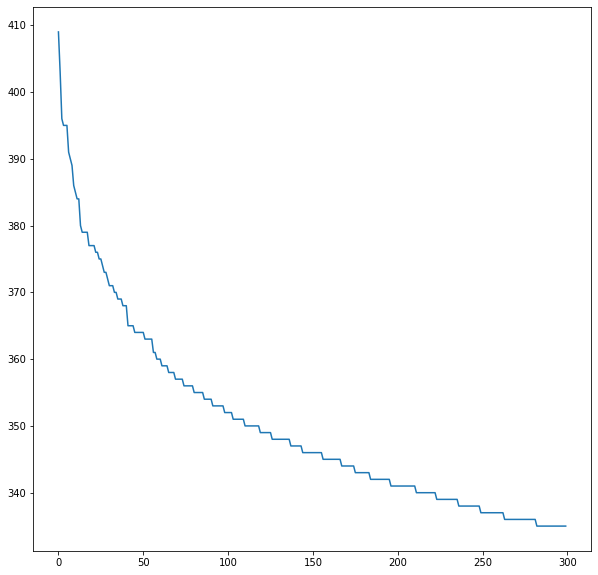

In [106]:
plt.figure(figsize=(10,10))
plt.plot(node_number_list[0:300])

In [107]:
number_of_center = 3
sample_center_node_name_list=list()

for i in range(number_of_center):
    sample_center_node_name_list.append(degree_pair_list[i][0])

In [108]:
sample_nodes_list = list()

for sample_center_node_name in sample_center_node_name_list:

    sample_nodes_list.append(sample_center_node_name)

    for neighbour in largest_sub_g.neighbors(sample_center_node_name):
        sample_nodes_list.append(neighbour)
    

In [109]:
sample_sub_g = largest_sub_g.subgraph(sample_nodes_list)

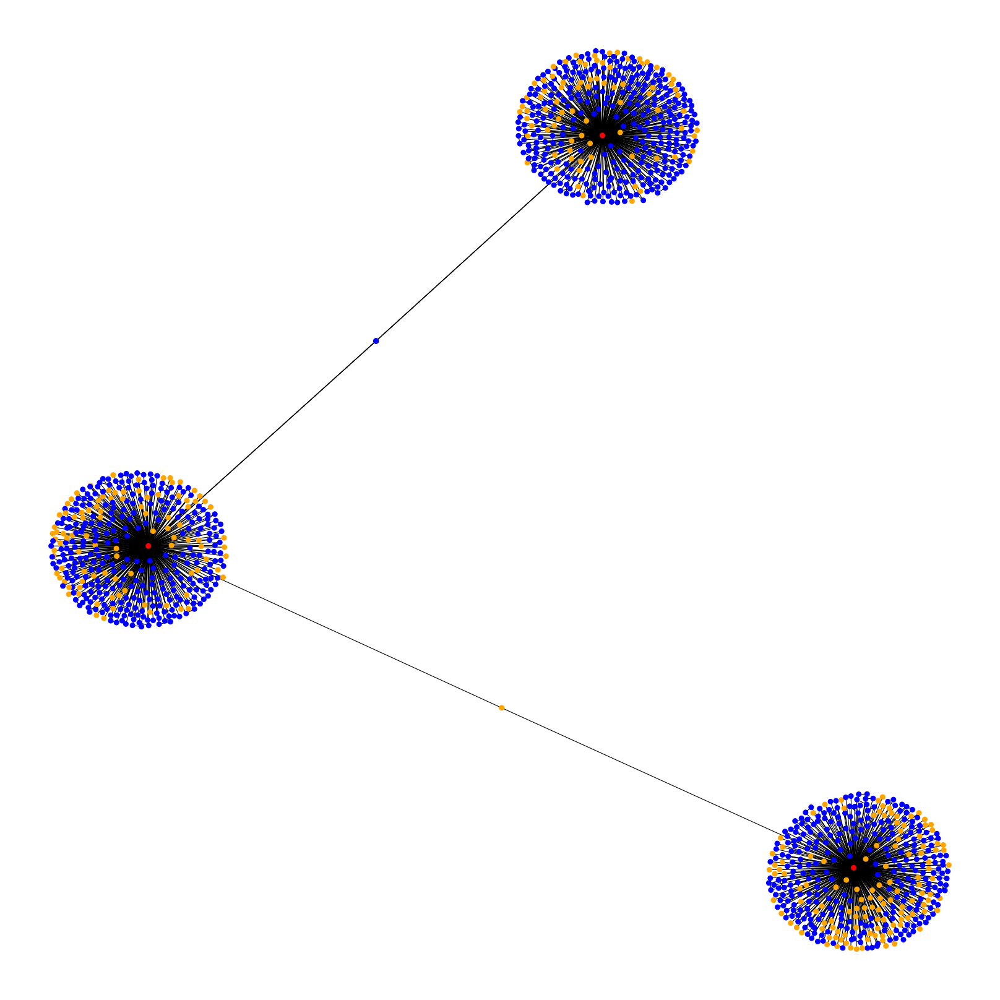

In [110]:
plt.figure(figsize=(20, 20), dpi=80)
nx.draw(sample_sub_g, node_size=50, node_color=[color_state_map[node[1]['type']] 
                    for node in sample_sub_g.nodes(data=True)])

In [111]:
largest_degree_df = pd.DataFrame(degree_pair_list)
largest_degree_df.columns=['node_name', 'degree']
largest_degree_df.sort_values(by='degree', inplace=True, ascending=False)
largest_degree_df.reset_index(inplace=True)
largest_degree_df['is_ip'] = largest_degree_df['node_name'].map(lambda x: '.' in x)

In [112]:
large_ip_threshold = 50
large_ip_df = largest_degree_df[(largest_degree_df['degree'] > large_ip_threshold) & (largest_degree_df['is_ip'] == True)]



In [113]:
large_ip_list = list(large_ip_df['node_name'])
len(large_ip_list)

2493

In [114]:
largest_sub_g_analyze = largest_sub_g.copy()

In [115]:
all_neighbour_collection = list()

for large_ip in large_ip_list:
    
    large_ip_neighbours = nx.neighbors(largest_sub_g_analyze, large_ip)
    
    neighbour_collection = list()
    
    for neighbour in large_ip_neighbours:
        second_order_neighbours = nx.neighbors(largest_sub_g_analyze, neighbour)
        
        ip_number = 0
        
        
        for second_order_neighbour in second_order_neighbours:
            if (largest_sub_g_analyze.nodes[second_order_neighbour]['type'] == 'ip'):
                ip_number = ip_number + 1
                
            if (ip_number >= 2):
                
                neighbour_collection.append(neighbour)
                break
        
    for each_neighbour in neighbour_collection:
        largest_sub_g_analyze.remove_edge(large_ip, each_neighbour)
        
    largest_sub_g_analyze.nodes[large_ip]['type'] = 'public_ip'
        
    all_neighbour_collection.append(neighbour_collection)

In [116]:
# remove the large_ips and their neighbours
# they are now seperated group with devices, cookies only access to large_ip

all_neighbour_collection = list()

for large_ip in large_ip_list:
    
    large_ip_neighbours = nx.neighbors(largest_sub_g_analyze, large_ip)
        
    all_neighbour_collection.extend(large_ip_neighbours)
        
largest_sub_g_analyze.remove_nodes_from(large_ip_list)
largest_sub_g_analyze.remove_nodes_from(all_neighbour_collection)

In [117]:
connected_device_ip_cookie = nx.connected_components(largest_sub_g_analyze)

node_number_list = list()
node_list = list()

for index, connected_device_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):
    node_number_list.append(len(connected_device_item))
    node_list.append(list(connected_device_item))
    
total_connected_group_number = len(node_number_list)

In [118]:
total_connected_group_number

15526

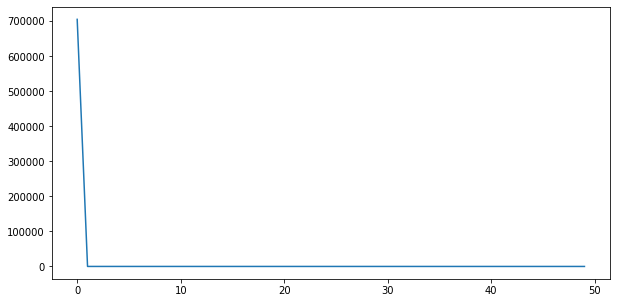

In [119]:
plt.figure(figsize=(10,5))
plt.plot(node_number_list[0:50])

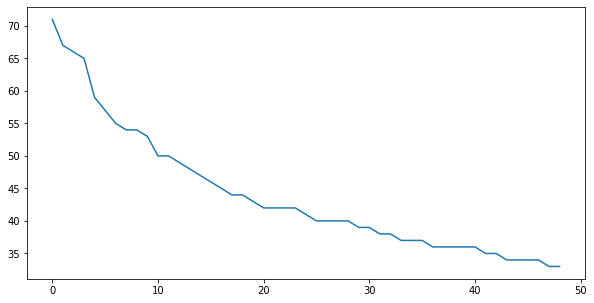

In [120]:
plt.figure(figsize=(10,5))
plt.plot(node_number_list[1:50])

In [121]:
device_collection, cookie_collection, \
    large_device_collection, large_cookie_collection, \
    small_community_list, large_community_list, large_community_apart_list =\
    seperate_community_from(largest_sub_g_analyze)

In [122]:
small_group_pair_set = get_production_set(device_collection, cookie_collection)
large_group_pair_set = get_production_set(large_device_collection, large_cookie_collection)

potential_pair_list.extend(small_group_pair_set)
potential_pair_type_list.extend([3] * len(small_group_pair_set))

potential_pair_list.extend(large_group_pair_set)
potential_pair_type_list.extend([4] * len(large_group_pair_set))

potential_pair_set = set(potential_pair_list)

cur_and_set = potential_pair_set & true_pair_set

cur_recall = len(cur_and_set)/len(true_pair_set)
cur_precision = len(cur_and_set)/len(potential_pair_set)
(cur_recall, cur_precision)


(0.1103880378463618, 0.7524834198731176)

In [123]:
right_number = len(cur_and_set)
potential_number = len(potential_pair_set)

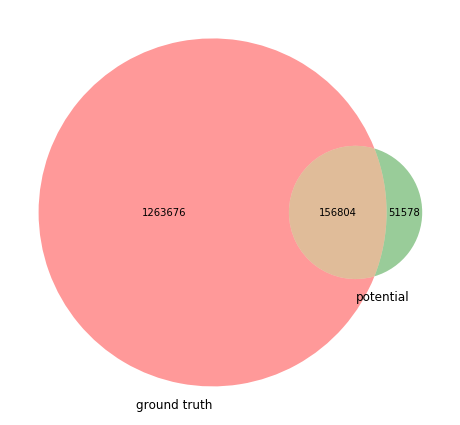

In [124]:
plt.figure(figsize=(8,8))
venn2(subsets = (true_sample_number-right_number, potential_number-right_number, right_number), set_labels = ('ground truth', 'potential'));
plt.show()

### re-consider the ip addresses we removed

for those devices, cookies only connect to these large IP addresses, maybe they are right pairs

In [179]:
largest_sub_g_analyze = largest_sub_g.copy()

In [180]:
all_neighbour_collection = list()

for large_ip in large_ip_list:
    
    large_ip_neighbours = nx.neighbors(largest_sub_g_analyze, large_ip)
    
    neighbour_collection = list()
    
    for neighbour in large_ip_neighbours:
        second_order_neighbours = nx.neighbors(largest_sub_g_analyze, neighbour)
        
        ip_number = 0
        
        
        for second_order_neighbour in second_order_neighbours:
            if (largest_sub_g_analyze.nodes[second_order_neighbour]['type'] == 'ip'):
                ip_number = ip_number + 1
                
            if (ip_number >= 2):
                
                neighbour_collection.append(neighbour)
                break
        
    for each_neighbour in neighbour_collection:
        largest_sub_g_analyze.remove_edge(large_ip, each_neighbour)
        
    largest_sub_g_analyze.nodes[large_ip]['type'] = 'public_ip'
        
    all_neighbour_collection.append(neighbour_collection)

In [181]:
all_neighbour_collection = list()

for large_ip in large_ip_list:
    
    large_ip_neighbours = nx.neighbors(largest_sub_g_analyze, large_ip)
        
    all_neighbour_collection.extend(large_ip_neighbours)

In [182]:
sample_nodes_list = list()

In [183]:
sample_nodes_list.extend(large_ip_list)
sample_nodes_list.extend(all_neighbour_collection)

In [184]:
sample_sub_g = largest_sub_g_analyze.subgraph(sample_nodes_list)

In [185]:
connected_device_ip_cookie = nx.connected_components(sample_sub_g)

node_number_list = list()
node_list = list()

for index, connected_device_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):
    node_number_list.append(len(connected_device_item))
    node_list.append(list(connected_device_item))
    
total_connected_group_number = len(node_number_list)

In [186]:
total_connected_group_number

2432

In [187]:
len(sample_nodes_list)

103303

In [188]:
node_number_list[0:10]

[260, 219, 202, 197, 192, 175, 172, 164, 163, 163]

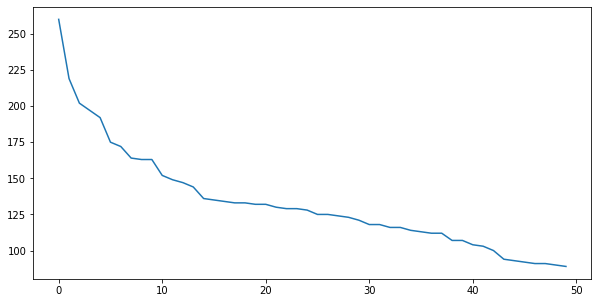

In [189]:
plt.figure(figsize=(10, 5))
plt.plot(node_number_list[0:50])

In [190]:
sample_node_list = list()
index = 0

connected_device_ip_cookie = nx.connected_components(sample_sub_g)

for index, connected_device_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):
    

    if (index > 100):
        break
       
    if (len(connected_device_item) < 400):

        sample_node_list.append(list(connected_device_item))

In [191]:
len(sample_node_list)

101

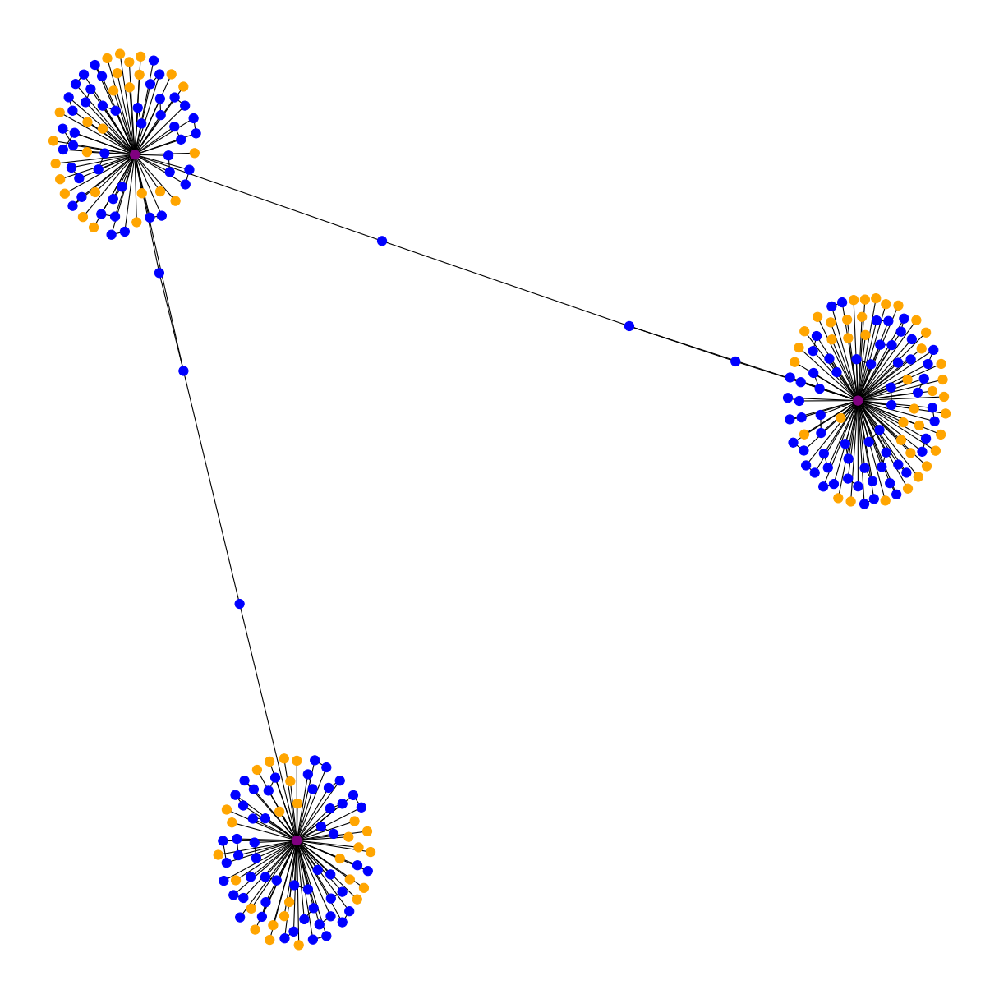

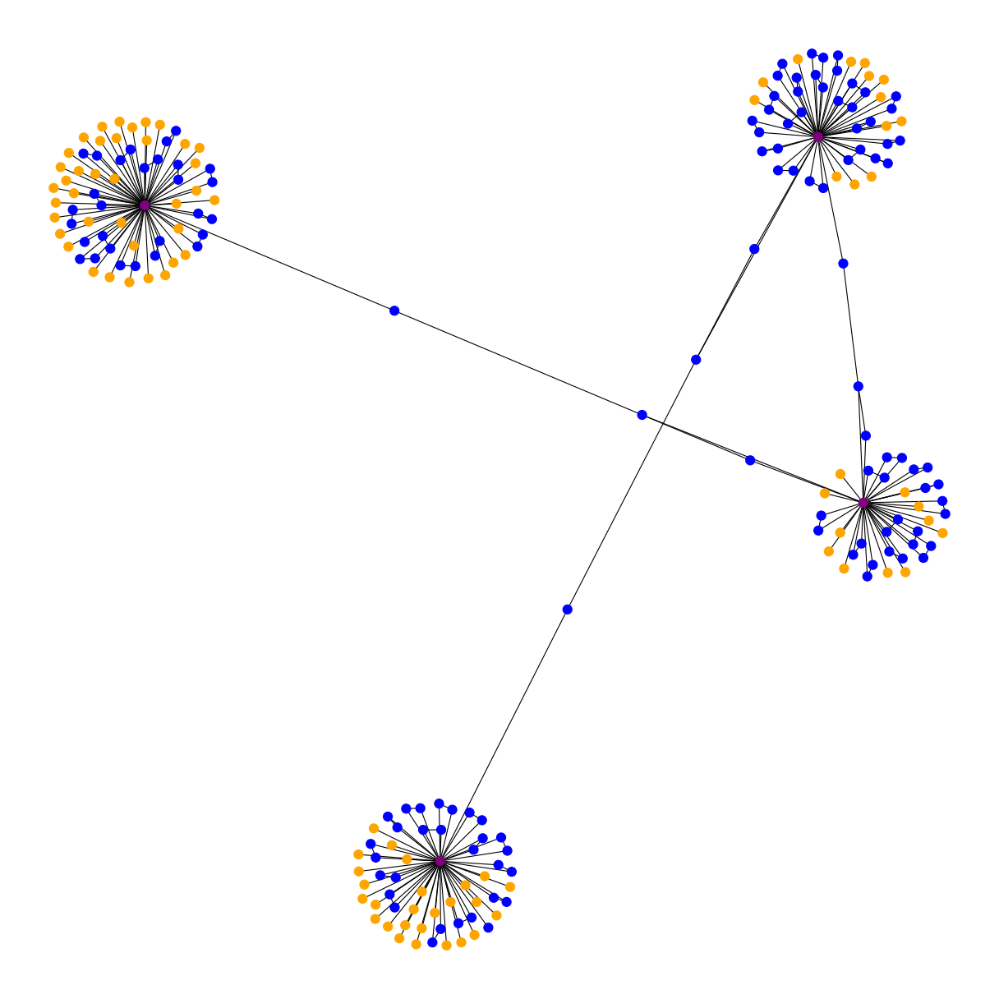

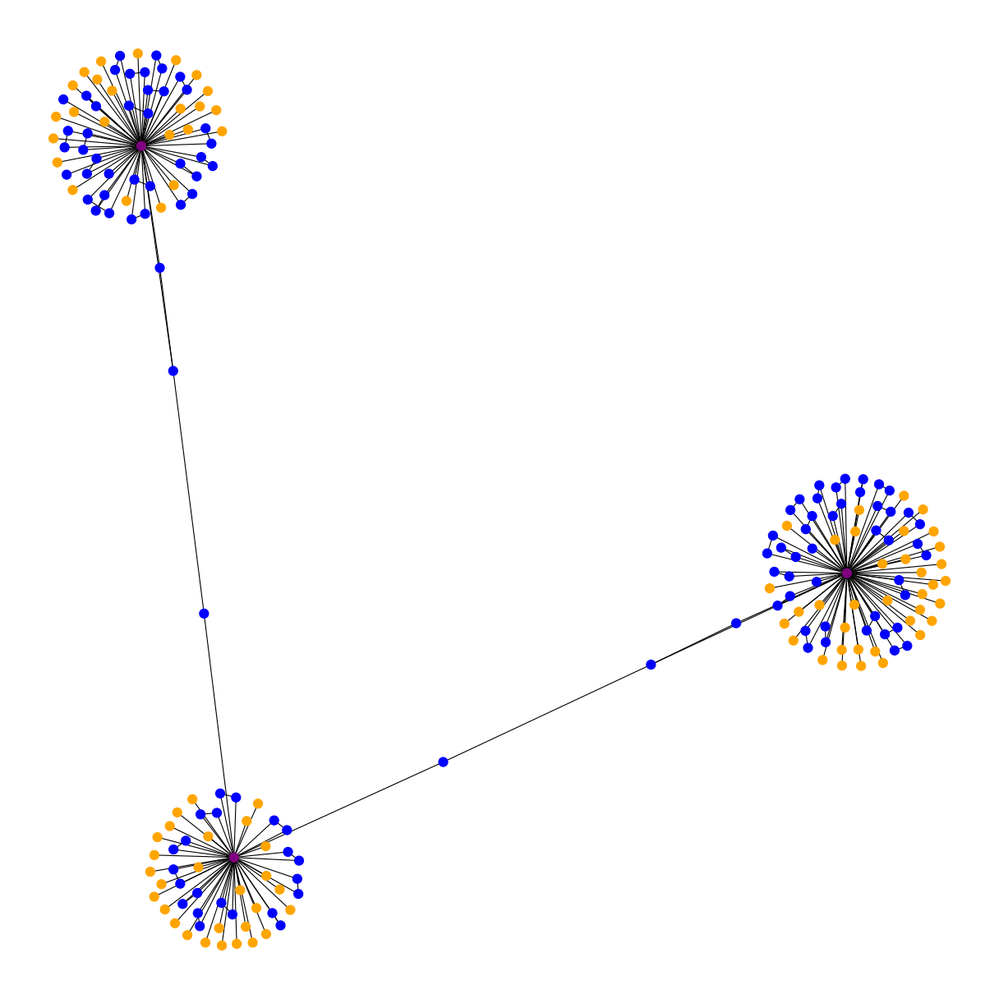

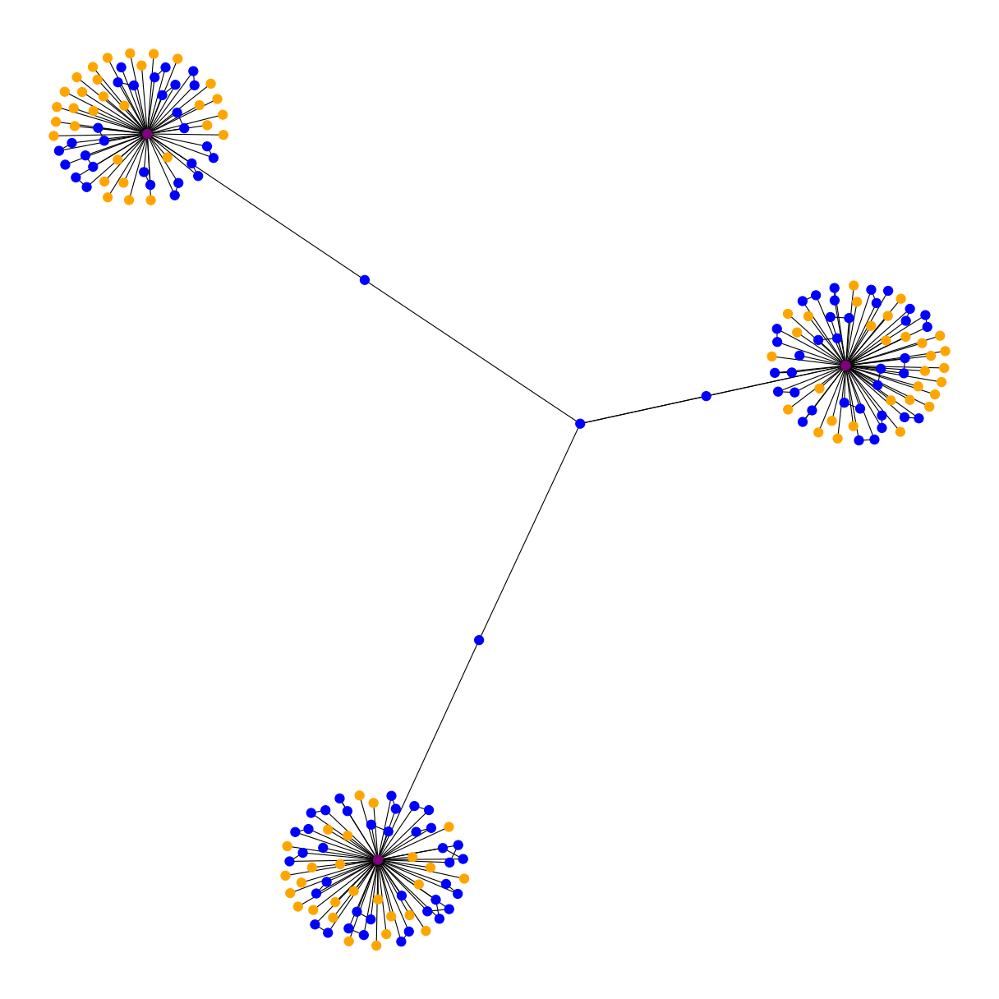

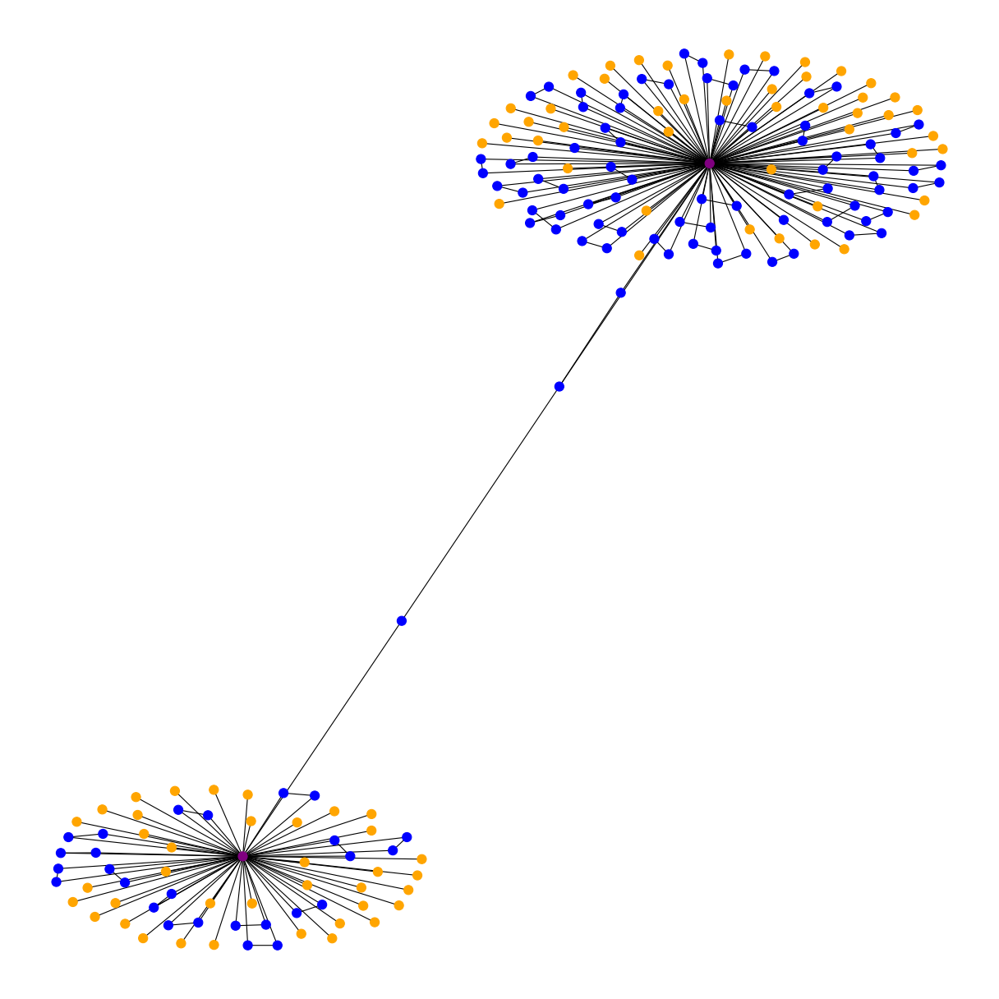

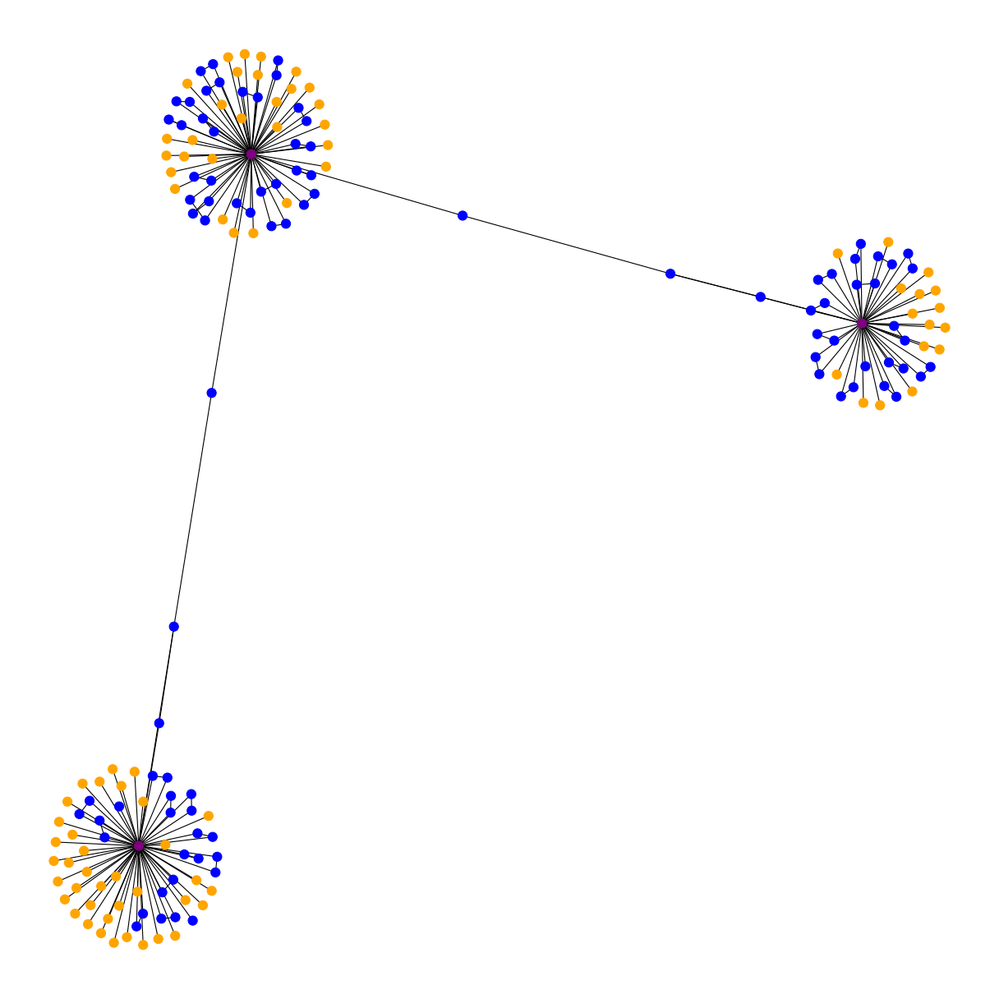

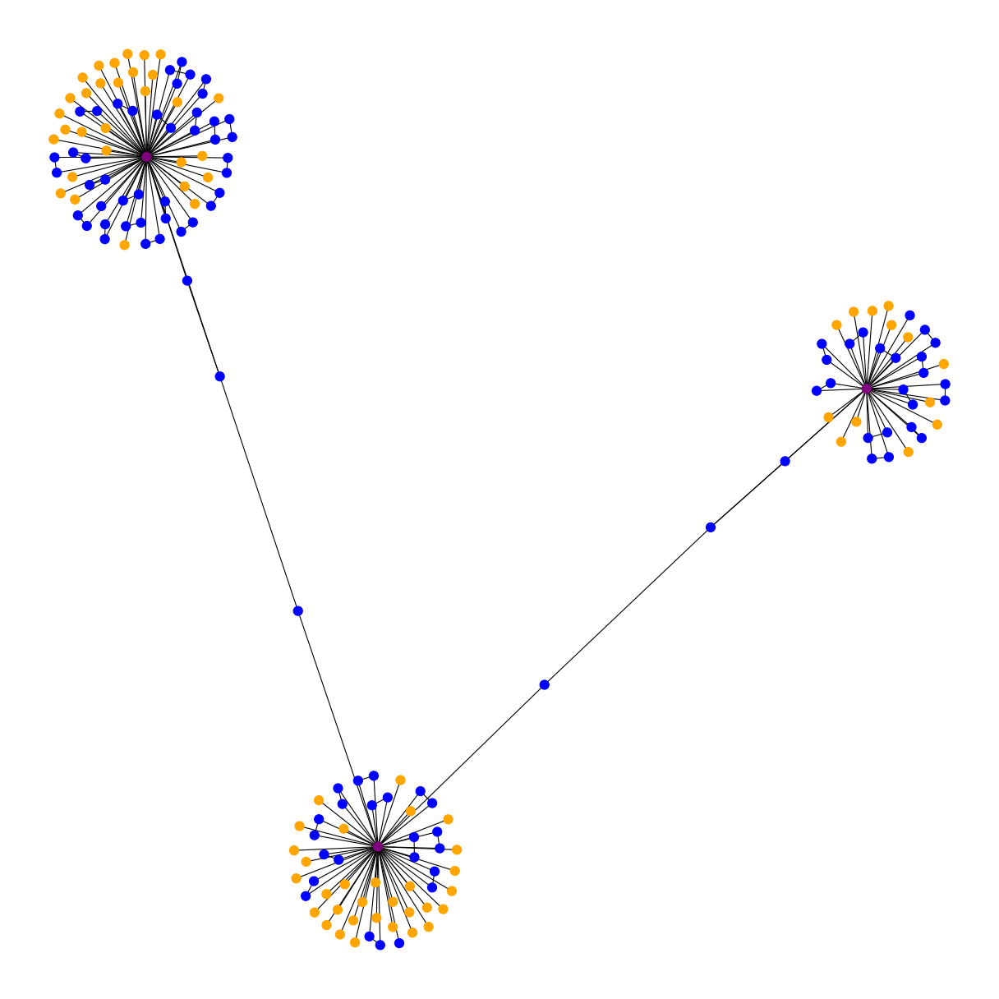

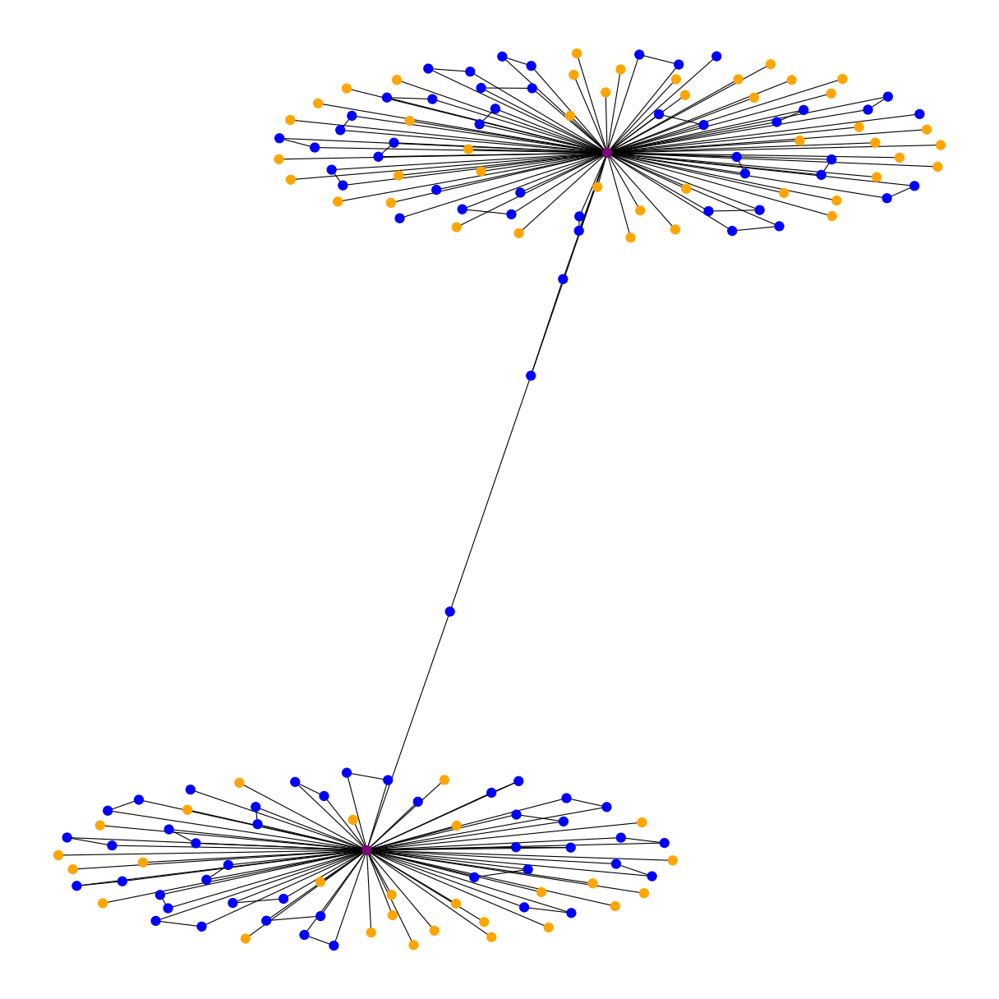

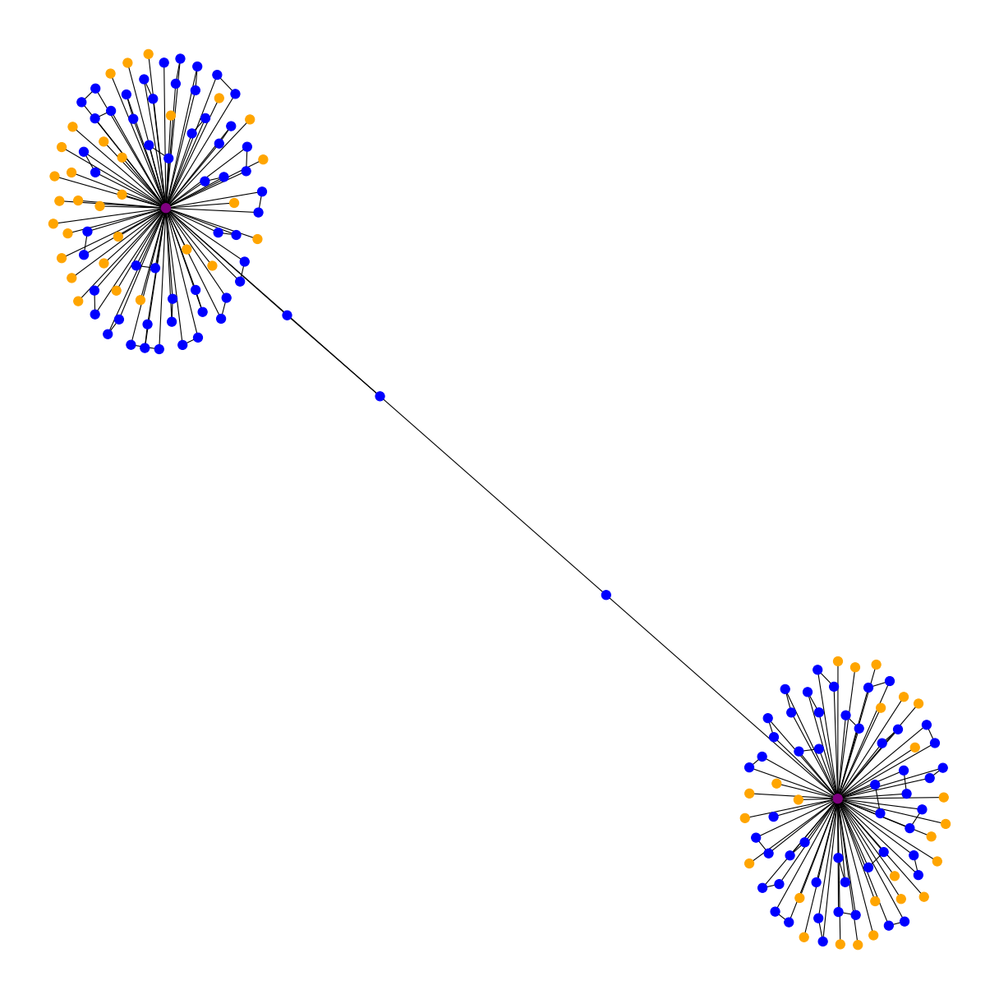

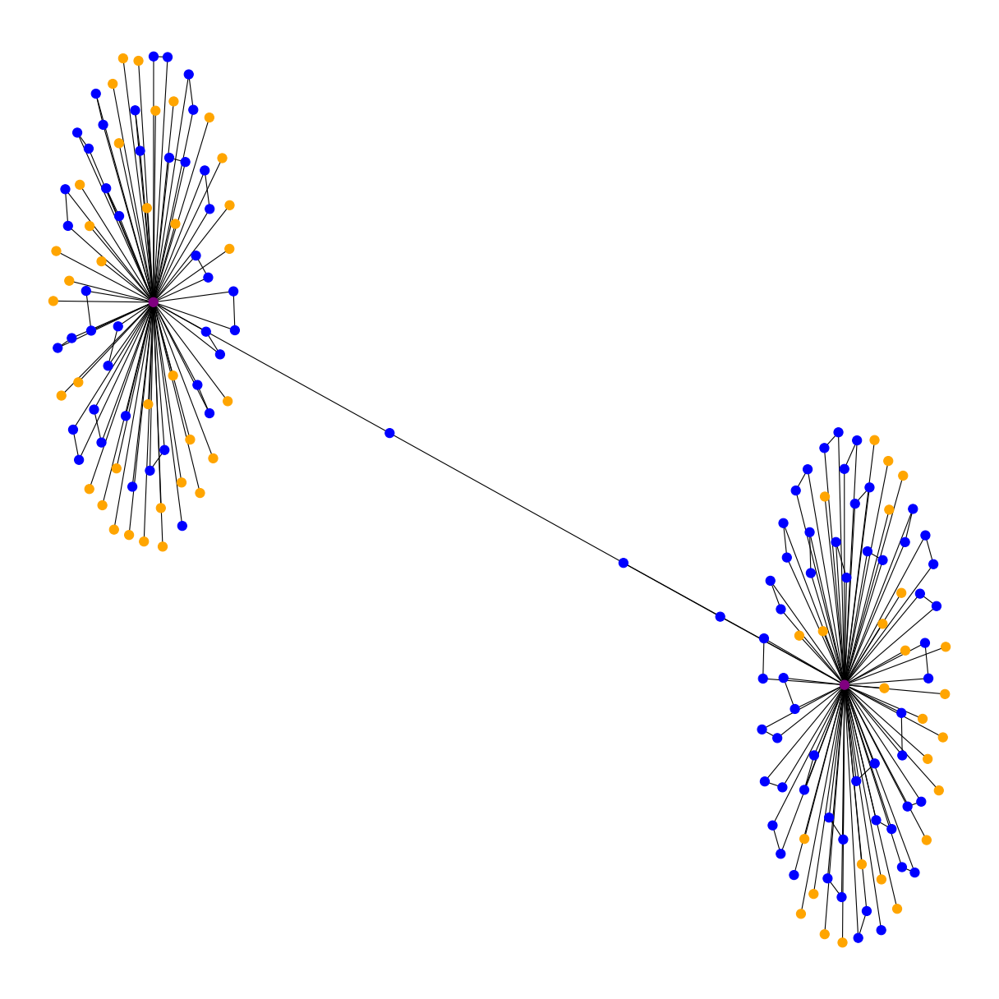

In [192]:
draw_community_list(largest_sub_g_analyze, sample_node_list, 0, 10)

In [193]:
node_types = nx.get_node_attributes(largest_sub_g_analyze, 'type')


In [198]:
ip_node_name_list = [k for k, v in node_types.items() if (v=='public_ip')]

In [199]:
len(ip_node_name_list)

2493

In [200]:
def get_pair_share_same_ip(target_g, ip_node_name_list, digree_limit=15):
    
    device_collection = list()
    cookie_collection = list()
    
    for sample_center_node_name in ip_node_name_list:
        
        
        if (target_g.degree(sample_center_node_name) < digree_limit):
            device_sub_collection = list()
            cookie_sub_collection = list()

            for neighbour in target_g.neighbors(sample_center_node_name):
                if (target_g.nodes[neighbour]['type'] == 'ip'):
                    # the node is an 'ip' node
                    # do nothing
                    pass

                elif (target_g.nodes[neighbour]['type'] == 'device'):
                    # the node is a 'device' node
                    device_sub_collection.append(neighbour)
                elif (target_g.nodes[neighbour]['type'] == 'cookie'):
                    # the node is a 'cookie' node
                    cookie_sub_collection.append(neighbour)

            device_collection.append(device_sub_collection)
            cookie_collection.append(cookie_sub_collection)
    
    return (device_collection, cookie_collection)
    

In [201]:
device_collection, cookie_collection =\
    get_pair_share_same_ip(largest_sub_g_analyze, ip_node_name_list)

In [202]:
new_pair_list = list()
new_pair_type_list = list()

for (pair, pair_type) in zip(potential_pair_list, potential_pair_type_list):
    if (pair_type < 5):
        new_pair_list.append(pair)
        new_pair_type_list.append(pair_type)

In [205]:
potential_pair_list = new_pair_list
potential_pair_type_list = new_pair_type_list

In [203]:
len(new_pair_list)

208382

In [204]:
len(potential_pair_list)

2622072

In [206]:
group_pair_set = get_production_set(device_collection, cookie_collection)


potential_pair_list.extend(group_pair_set)
potential_pair_type_list.extend([5] * len(group_pair_set))


potential_pair_set = set(potential_pair_list)

cur_and_set = potential_pair_set & true_pair_set

cur_recall = len(cur_and_set)/len(true_pair_set)
cur_precision = len(cur_and_set)/len(potential_pair_set)


right_number = len(cur_and_set)
potential_number = len(potential_pair_set)

(cur_recall, cur_precision)

(0.11048307614327552, 0.7216216589035364)

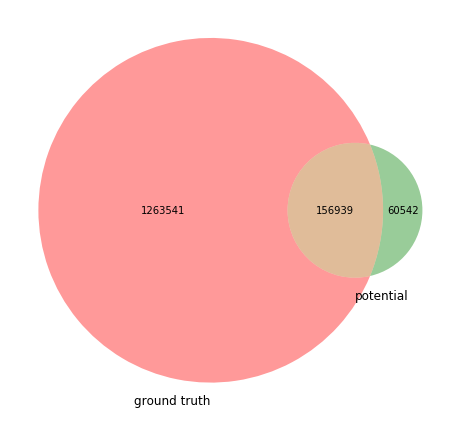

In [207]:
plt.figure(figsize=(8,8))
venn2(subsets = (true_sample_number-right_number, potential_number-right_number, right_number), set_labels = ('ground truth', 'potential'));
plt.show()

In [208]:
# remove the large_ips and their neighbours
# they are now seperated group with devices, cookies only access to large_ip

all_neighbour_collection = list()

for large_ip in large_ip_list:
    
    large_ip_neighbours = nx.neighbors(largest_sub_g_analyze, large_ip)
        
    all_neighbour_collection.extend(large_ip_neighbours)
        
largest_sub_g_analyze.remove_nodes_from(large_ip_list)
largest_sub_g_analyze.remove_nodes_from(all_neighbour_collection)

### now look into the mass group

In [209]:
largest_components=max(nx.connected_components(largest_sub_g_analyze),key=len)

largest_items = list(largest_components)

largest_sub_g = largest_sub_g_analyze.subgraph(largest_items)

(largest_sub_g.number_of_nodes(), largest_sub_g.number_of_edges())

(705533, 1388244)

In [210]:
connected_device_ip_cookie = nx.connected_components(largest_sub_g)

node_number_list = list()
node_list = list()

for index, connected_device_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):
    node_number_list.append(len(connected_device_item))
    node_list.append(list(connected_device_item))
    
total_connected_group_number = len(node_number_list)

In [211]:
total_connected_group_number

1

In [212]:
degree_pair = nx.degree(largest_sub_g)
degree_pair_list = list(degree_pair)
degree_pair_list.sort(key=lambda x:x[1], reverse=True)
node_number_list = [item[1] for item in degree_pair_list]



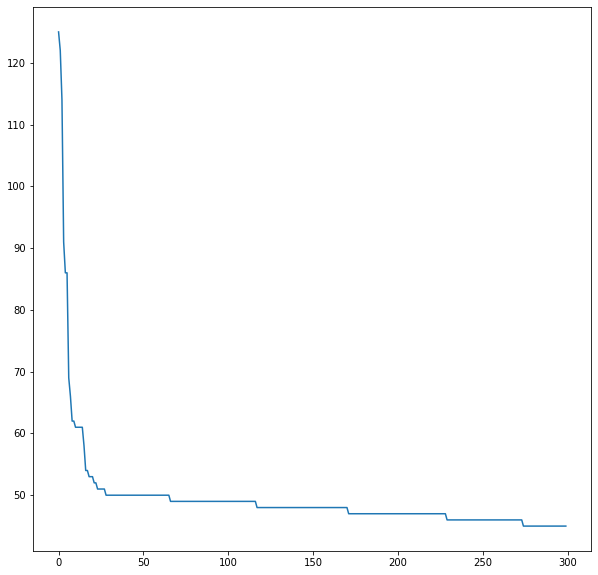

In [213]:
plt.figure(figsize=(10,10))
plt.plot(node_number_list[0:300])

#### one simple way is finding out all the pairs share same IP



In [216]:
node_types = nx.get_node_attributes(largest_sub_g, 'type')
ip_node_name_list = [k for k, v in node_types.items() if (v == 'ip')]


In [217]:
len(ip_node_name_list)

209147

In [229]:
device_collection, cookie_collection =\
    get_pair_share_same_ip(largest_sub_g, ip_node_name_list, 60)

In [230]:
len(device_collection)

209147

In [231]:
len(cookie_collection)

209147

In [232]:
# potential_pair_list = potential_pair_list[0:-1170674]
# potential_pair_type_list = potential_pair_type_list[0:-1170674]

In [233]:
group_pair_set = get_production_set(device_collection, cookie_collection)


potential_pair_list.extend(group_pair_set)
potential_pair_type_list.extend([6] * len(group_pair_set))


potential_pair_set = set(potential_pair_list)

cur_and_set = potential_pair_set & true_pair_set

cur_recall = len(cur_and_set)/len(true_pair_set)
cur_precision = len(cur_and_set)/len(potential_pair_set)


right_number = len(cur_and_set)
potential_number = len(potential_pair_set)

(cur_recall, cur_precision)

(0.28924588871367424, 0.16731408019566155)

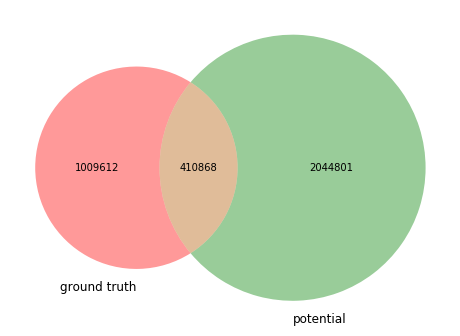

In [234]:
plt.figure(figsize=(8,8))
venn2(subsets = (true_sample_number-right_number, potential_number-right_number, right_number), set_labels = ('ground truth', 'potential'));
plt.show()

In [235]:
len(potential_pair_list), len(potential_pair_type_list)

(2455669, 2455669)

In [236]:
potential_matching_pair_df = pd.DataFrame()

In [237]:
potential_matching_pair_df['device_cookie'] = potential_pair_list
potential_matching_pair_df['pair_type'] = potential_pair_type_list

In [238]:
len(potential_matching_pair_df)

2455669

In [239]:
potential_matching_pair_df.head()

,device_cookie,pair_type
0,ba5b4cd4b6c733be8b969c6287f84ad5_7ded2aae109cb...,1
1,0dbde15369013998a6926c8ce453fb4c_1c8b0bf15180b...,1
2,bf2d6a63154afa23b2e066bd720c0fba_2a28c7555b1dd...,1
3,70748f93204c5e7c46990d00b89f3536_475c846f31596...,1
4,60e0f05d341d2ae101cb4695f3a5b686_7add9cf1ea513...,1


In [241]:
potential_matching_pair_df.to_csv(file_prefix + 'potential_matching_pair.csv', index=False, header=True)

## diving into the mass group

In [242]:
%%time
largest_sub_g_analyze = largest_sub_g.copy()

CPU times: user 18.8 s, sys: 847 ms, total: 19.7 s
Wall time: 19.7 s


In [243]:
degree_pair = nx.degree(largest_sub_g_analyze)
degree_pair_list = list(degree_pair)
degree_pair_list.sort(key=lambda x:x[1])

In [244]:
degree_pair_list[0]

('428cba30d3ae5213c7449277f9e41dbf', 1)

In [245]:
node_name_list = [item[0] for item in degree_pair_list]

In [270]:
%%time

target_g = largest_sub_g_analyze

ip_number_limit = 5

all_visited_node_group = list()
all_visited_node = list()
expose_node_left = list()

for index, entry_node in enumerate(node_name_list):
    
    if (index > 20):
        break
        
    if (entry_node in target_g.nodes):
        
        visited_node_list = list()
        expose_node_list = list()

        visited_node_list.append(entry_node)
        expose_node_list.append(entry_node)

        visited_set = set(visited_node_list)
        visited_number = len(visited_set)

        if (target_g.nodes[entry_node]['type'] == 'ip'):
            meet_ip_node_before = True
        else:
            meet_ip_node_before = False

        expose_step = 10

        for i in range(expose_step):
            neighbour_list = list()

            for expose_node in expose_node_list:

                for neighbour in nx.neighbors(target_g, expose_node):

                    if (target_g.nodes[neighbour]['type'] == 'ip'):

                        if (meet_ip_node_before and target_g.degree(neighbour) > ip_number_limit):

                            #has meet ip node before in this group
                            # and current neighbour is an ip node has large degree
                            # going to ignore this node, as it looks like a public ip
                            pass
                        else:
                            # either we didn't meet ip node before
                            # or current ip node doesn't looke like a public ip
                            neighbour_list.append(neighbour)
                            meet_ip_node_before = True
                    else:
                        neighbour_list.append(neighbour)

            neighbour_set = set(neighbour_list)


            expose_set = neighbour_set - visited_set

            expose_node_list = list(expose_set)
            visited_node_list.extend(neighbour_list)
            visited_set = set(visited_node_list)

            visited_number = len(visited_set)

        if (len(expose_node_list) > 0):
            # has expose node left without exposing
            pass
        else:
#             target_g.remove_nodes_from(all_visited_node)
            pass

        all_visited_node_group.append(visited_node_list)
        all_visited_node.extend(visited_node_list)
        expose_node_left.append(expose_node_list)


CPU times: user 56.9 ms, sys: 43.5 ms, total: 100 ms
Wall time: 99.4 ms


In [271]:
len(set(all_visited_node))

2890

In [272]:
len(expose_node_left)

21

In [273]:
[len(expose_nodes) for expose_nodes in expose_node_left ]

[1, 50, 0, 468, 27, 1, 0, 34, 3, 106, 1, 7, 0, 12, 8, 11, 0, 6, 0, 0, 7]

In [274]:
edge_node_g = target_g.subgraph(all_visited_node).copy()

In [275]:
edge_node_g.number_of_nodes(), edge_node_g.number_of_edges()

(2890, 4147)

In [276]:
for i in range(len(expose_node_list)):
    break_point_name = 'break_point_' + str(i)
#     print (break_point_name)
    edge_node_g.add_edge(expose_node_list[i], break_point_name)
    edge_node_g.nodes[break_point_name]['type'] = 'break_point'

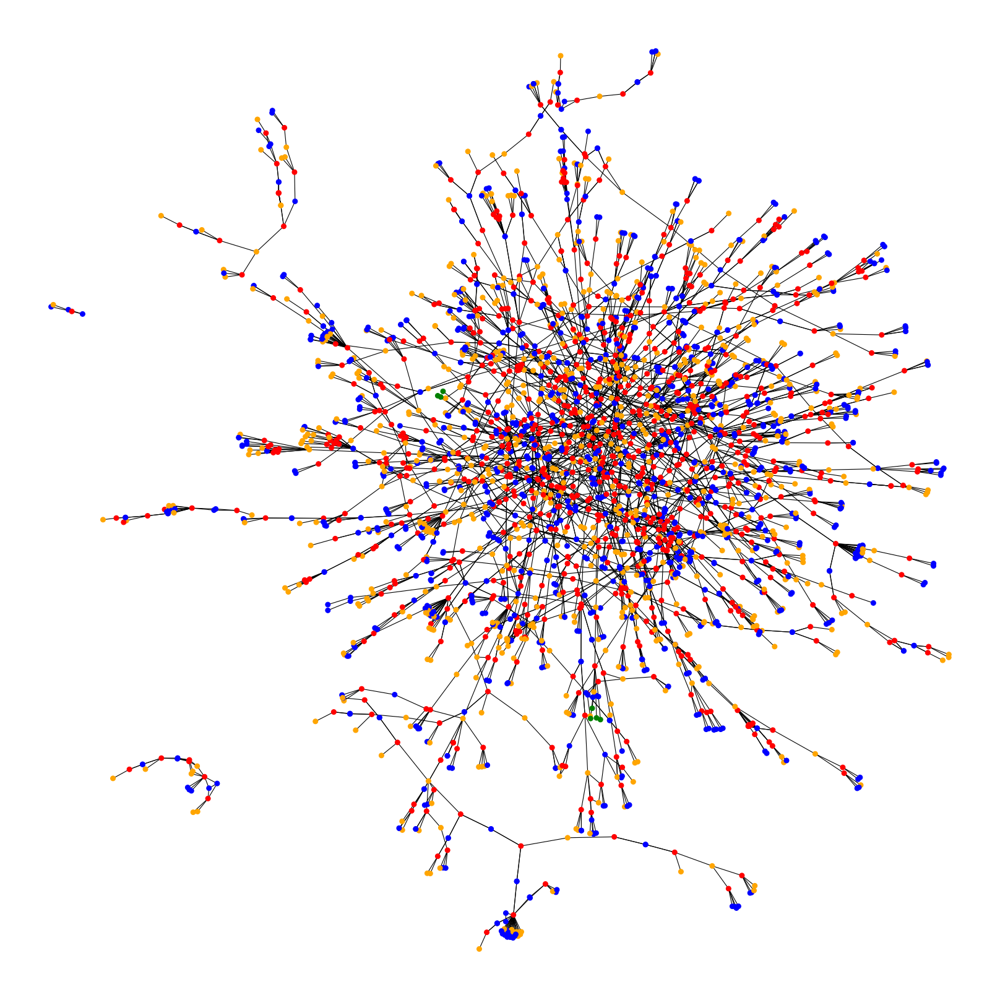

In [277]:
display_graph(edge_node_g)

In [284]:
node_at_edge_g = largest_sub_g.subgraph(all_visited_node).copy()

In [290]:
for index, expose_node in enumerate(expose_node_list):
    break_point_name = 'break_point_' + str(index)
    node_at_edge_g.add_edge(expose_node, break_point_name)
    node_at_edge_g.nodes[break_point_name]['type'] = 'break_point'

TypeError: unhashable type: 'list'

In [286]:
connected_device_ip_cookie = nx.connected_components(node_at_edge_g)

node_number_list = list()
node_list = list()

for index, connected_device_item in enumerate(sorted(connected_device_ip_cookie, key=len, reverse=True)):
    node_number_list.append(len(connected_device_item))
    node_list.append(list(connected_device_item))
    
total_connected_group_number = len(node_number_list)

In [287]:
total_connected_group_number

21

In [288]:
node_number_list

[1508,
 288,
 174,
 160,
 109,
 82,
 77,
 65,
 64,
 48,
 48,
 46,
 44,
 37,
 34,
 28,
 22,
 22,
 19,
 17,
 5]

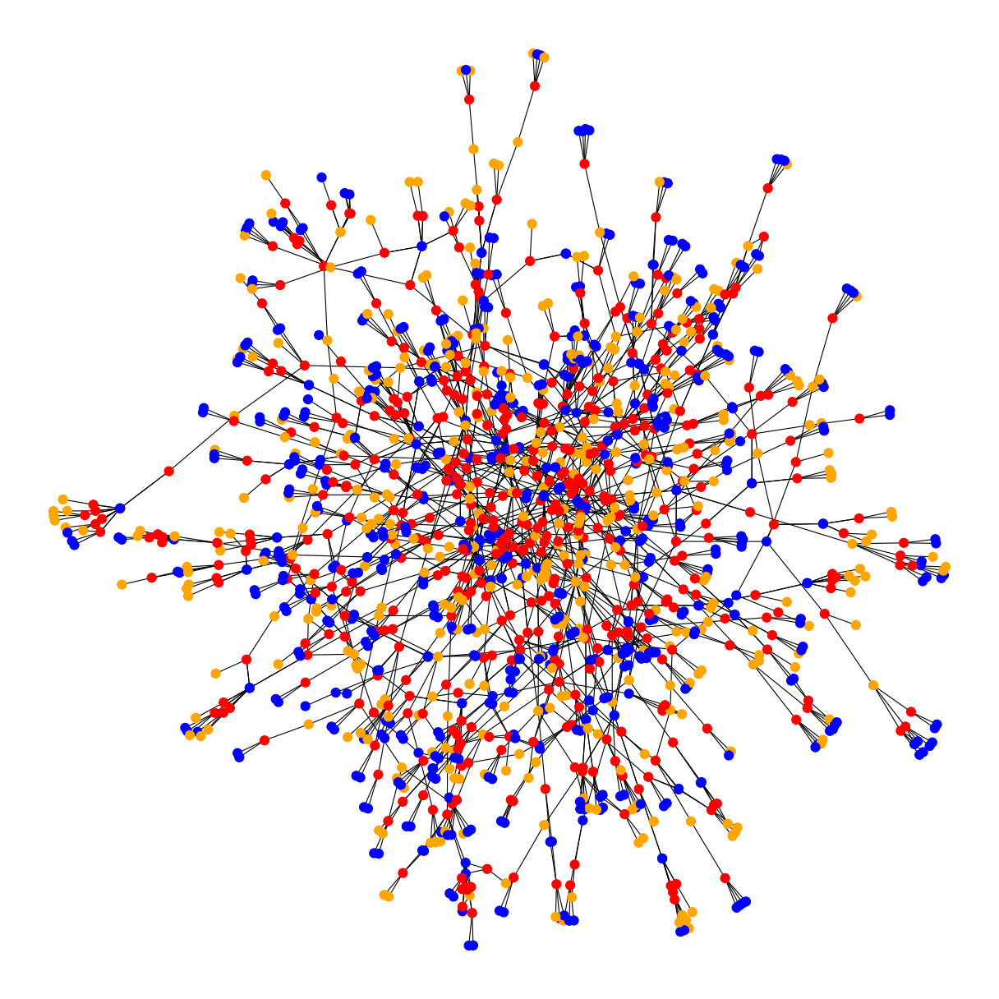

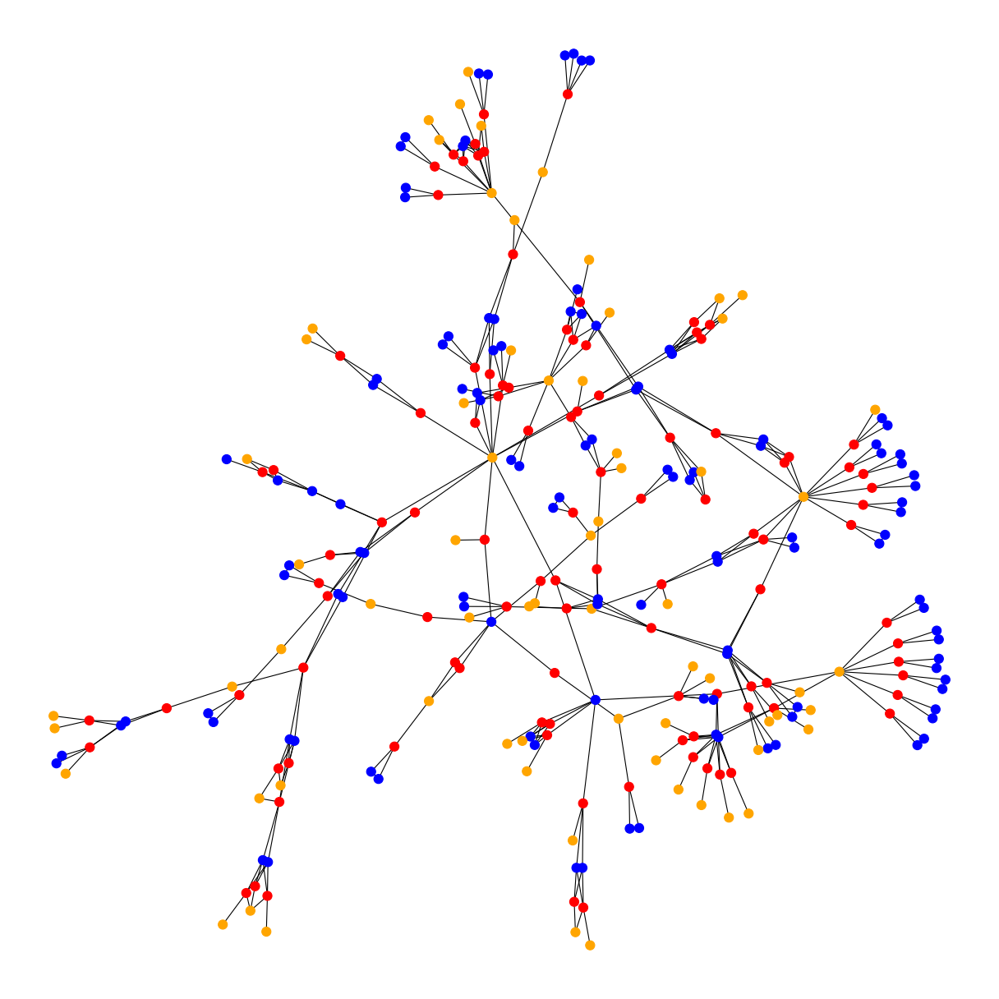

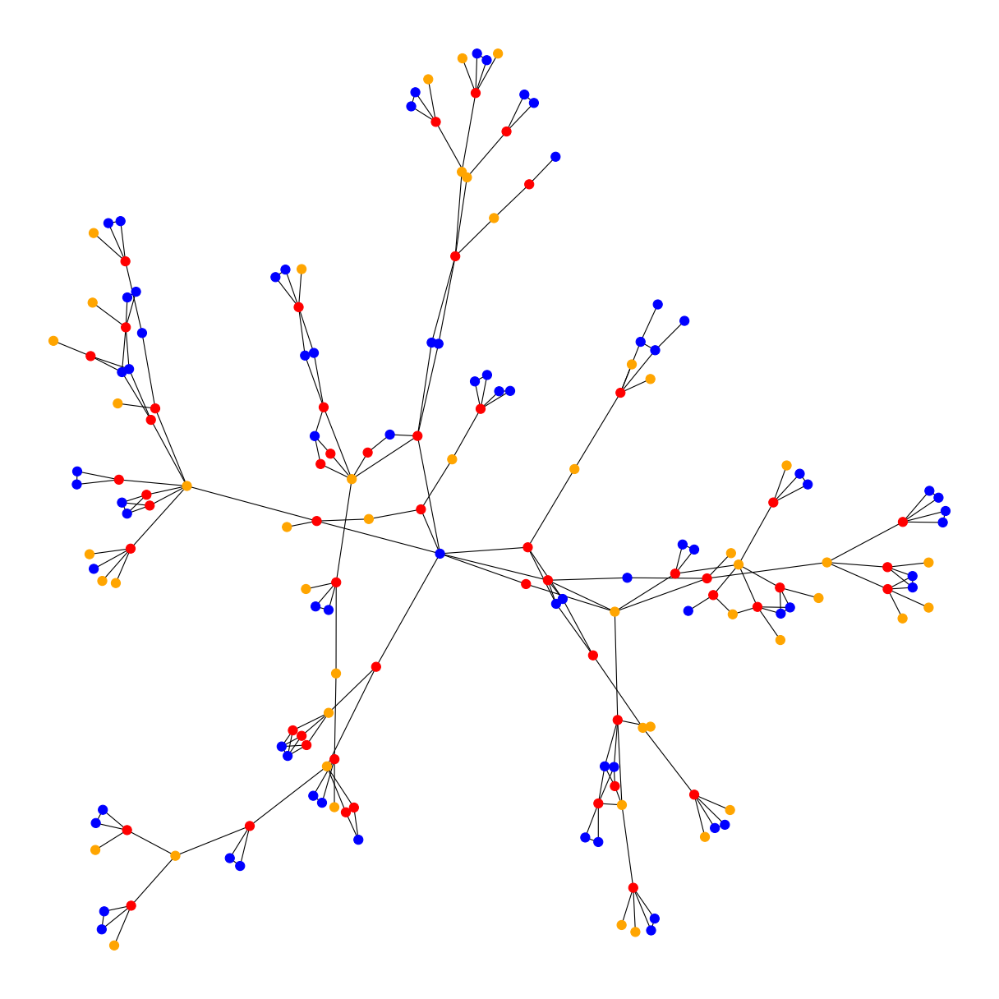

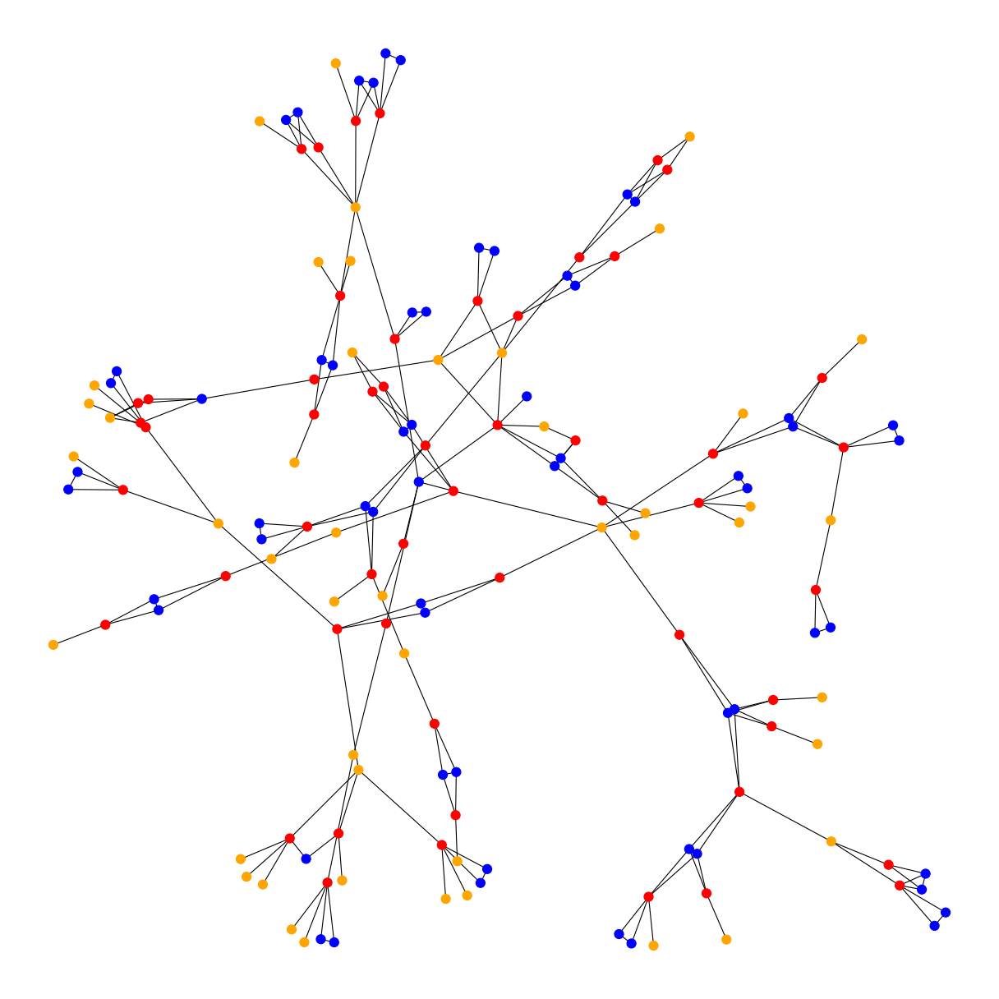

In [289]:
draw_community_list(node_at_edge_g, node_list, 0, 4)